<a href="https://colab.research.google.com/github/Desiree270122/AKG/blob/main/Une_autre_copie_de_AKG_louvain.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [153]:
!pip install rdflib

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [154]:
!pip install rdflib networkx scikit-learn matplotlib


In [155]:
from rdflib import URIRef, BNode, Literal
from rdflib import Namespace
from rdflib.namespace import CSVW, DC, DCAT, DCTERMS, DOAP, FOAF, ODRL2, ORG, OWL
from rdflib import Graph, URIRef, Literal, BNode
from rdflib.namespace import FOAF, RDF

In [156]:
from rdflib import Graph, RDF, URIRef, Namespace

# Load the RDF data
graph = Graph()
graph.parse("/content/drive/MyDrive/teaching_akg.ttl", format="ttl")

# Define namespace and type for entities (adjust as needed)
TAO = Namespace("http://sonfack.com/2024/01/tao#")  # Replace with your actual namespace

# Extract and print relevant assertions
relevant_assertions = []

for subj, pred, obj in graph:
    # Exclude subjects and predicates starting with "has" or "is"
    if not str(pred).startswith("http://sonfack.com/2024/01/tao#has") and not str(pred).startswith("http://sonfack.com/2024/01/tao#is"):
        relevant_assertions.append((subj, pred, obj))

# Print relevant assertions
for subj, pred, obj in relevant_assertions:
    print(f"Subject: {subj.split('#')[-1]}\nPredicate: {pred.split('#')[-1]}\nObject: {obj.split('#')[-1]}\n" )



Subject: http://sonfack.com/2023/12/tao/Moral
Predicate: subClassOf
Object: http://sonfack.com/2023/12/cao/Subject

Subject: http://sonfack.com/2023/12/tao/book-b4d784d0-8be6-473f-a4cc-3c5ff8a80b6d
Predicate: type
Object: http://sonfack.com/2023/12/tao/HardDocument

Subject: http://sonfack.com/2023/12/tao/laptop-bf775e20-71f6-4587-a518-2c0e73fa7470
Predicate: type
Object: http://sonfack.com/2023/12/tao/Laptop

Subject: http://sonfack.com/2023/12/tao/Physical
Predicate: label
Object: Physical subject

Subject: http://sonfack.com/2023/12/tao/10AM-f5ee7bc0-fb61-4d4e-9a32-565a5a7df03a
Predicate: http://sonfack.com/2023/12/cao/inXSDDateTime
Object: 2002-05-10T10:00:00

Subject: http://sonfack.com/2023/12/tao/isFoundIn
Predicate: range
Object: http://sonfack.com/2023/12/cao/Location

Subject: http://sonfack.com/2023/12/tao/12AM-b1f89d0f-6774-4ff6-838e-bf9738c1ff9a
Predicate: http://sonfack.com/2023/12/cao/inXSDDateTime
Object: 2002-05-08T12:00:00

Subject: http://sonfack.com/2023/12/tao/seco

In [157]:
from rdflib import Namespace, Graph, URIRef
from rdflib.namespace import RDF
import networkx as nx
import matplotlib.pyplot as plt

akg_file = "/content/drive/MyDrive/teaching_akg.ttl"
g = Graph()
g.parse(akg_file)
G = nx.DiGraph()
akg_namespace = Namespace("http://sonfack.com/2023/12/tao/")
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")


def read_all_activities(akg: Graph, as_str=True) -> list:
    """This function returns all activities of an activity knowledge graph
    - akg: an activity knowledge graph as parsed by RDFLib
    - as_str: (boolean) tells if the activities are simple str default = True
    """
    activities_list = [str(activity) if as_str else activity for activity in akg.subjects(predicate=RDF.type, object=cao_namespace.Activity, unique=True)]
    return activities_list


def read_akg_node(node_uri: str, akg:Graph, as_str=True) -> dict:
    """This function returns all elements directly linked to a akg node
    - activity_uri (string): the given activity uri in graph akg
    - akg (Graph): an activity knowledge graph as parsed by RDFLib
    """

    activity_info = {}
    activity_uri_ref = f"{akg_namespace}{node_uri}"
    print(activity_uri_ref)
    for act_predicate, act_object in akg.predicate_objects(subject=URIRef(activity_uri_ref)):
        pred = act_predicate
        obj = act_object
        if as_str:
            pred = str(act_predicate)
            obj = str(act_object)
        if pred in activity_info:
            existing_objects = activity_info[pred] + [obj]
            activity_info[pred] = existing_objects
        else:
            activity_info[pred] = [obj]
    return activity_info


In [158]:
def add_activity_to_nxgraph(G,activity_uri, activity_info):
  print("affichage des informations", activity_info)
  activity_g = nx.DiGraph()
  for pred, obj_list in activity_info.items():

    pred_label = pred.split('/')[-1]
    for obj in obj_list:

      obj_label = obj.split('/')[-1]
      G.add_node(activity_uri)
      G.add_node(obj_label)
      G.add_edge(activity_uri, obj_label, label=pred_label)
      activity_g.add_node(activity_uri)
      activity_g.add_node(obj_label)
      activity_g.add_edge(activity_uri, obj_label, label=pred_label)
  visualize_activity(activity_g)

In [159]:
def visualize_activity(G):
  # Visualize the graph
  plt.figure(figsize=(12, 12))

  # Generate positions for nodes using a layout algorithm
  pos = nx.spring_layout(G, seed=42)

  # Draw the nodes and edges
  nx.draw(G, pos, with_labels=True, node_size=300, node_color="blue", font_size=5, font_weight="bold", edge_color="black")

  # Draw edge labels
  edge_labels = nx.get_edge_attributes(G, 'label')
  nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='green', font_size=8)

  # Show plot
  plt.title("Graphe de Connaissances des Activités")
  plt.show()


['http://sonfack.com/2023/12/tao/dbcourse-b63a9944-19f6-4f41-bcbd-9333ede86272', 'http://sonfack.com/2023/12/tao/dbtutorial-78aca3f8-53fd-4f47-9406-414b493efe19', 'http://sonfack.com/2023/12/tao/pycourse-3f993bf5-1c2f-4f58-b85a-7b6b92bcf64b', 'http://sonfack.com/2023/12/tao/pypractical-f18f0361-3f12-4b3d-9459-ce2a019b4668', 'http://sonfack.com/2023/12/tao/uicourse-eaf2d283-4eb8-4024-a2c5-539984984fdd', 'http://sonfack.com/2023/12/tao/pmcourse-adee0f07-9e90-412b-95d4-b45d7a7476bb', 'http://sonfack.com/2023/12/tao/secourse-511f491d-ea2b-428f-900e-604ea778dab5', 'http://sonfack.com/2023/12/tao/setutorial-adbef907-11e0-40c1-8dd2-37eb02899ea9', 'http://sonfack.com/2023/12/tao/sepractical-88ca540f-fd64-4a3c-92fd-590a12f1f46b', 'http://sonfack.com/2023/12/tao/seproject-d3e90a3c-f550-45eb-b00e-59a3c6120318']
http://sonfack.com/2023/12/tao/dbcourse-b63a9944-19f6-4f41-bcbd-9333ede86272
{'http://www.w3.org/1999/02/22-rdf-syntax-ns#type': ['http://sonfack.com/2023/12/cao/Activity'], 'http://sonfac

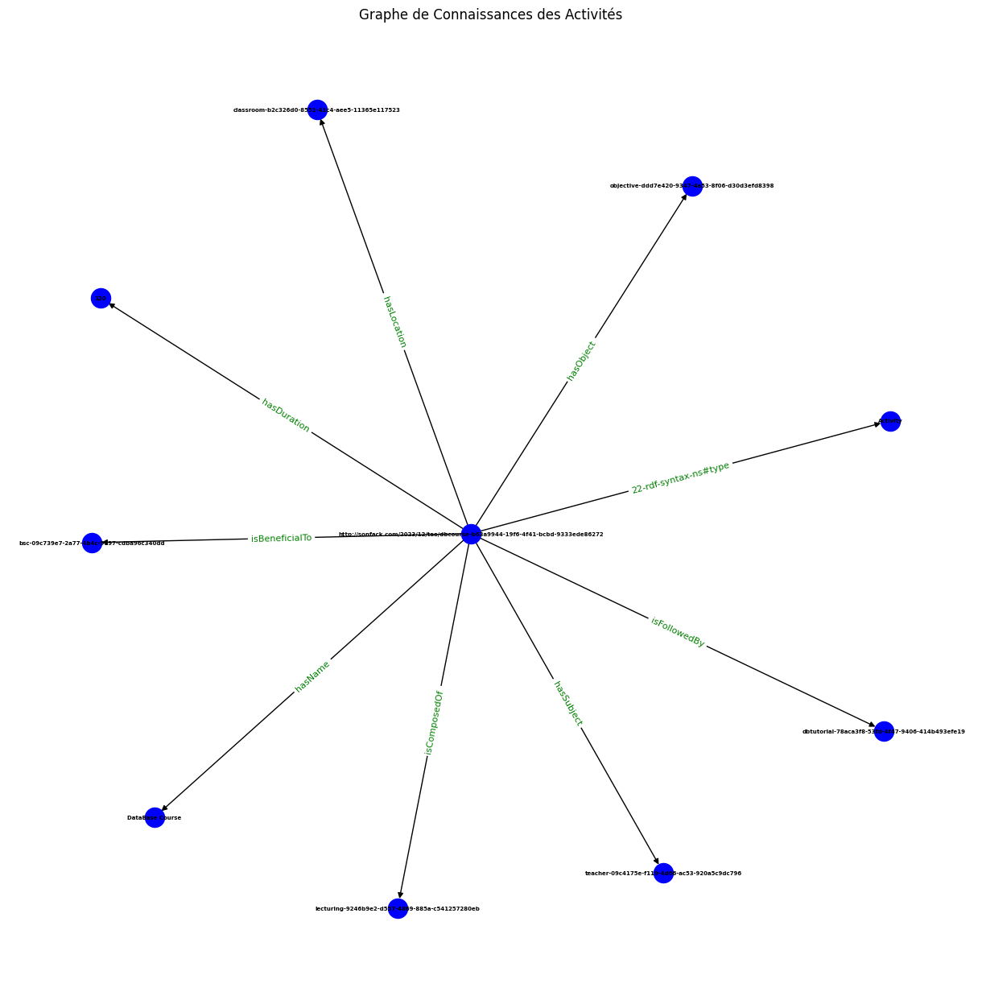

http://sonfack.com/2023/12/tao/dbtutorial-78aca3f8-53fd-4f47-9406-414b493efe19
{'http://www.w3.org/1999/02/22-rdf-syntax-ns#type': ['http://sonfack.com/2023/12/cao/Activity'], 'http://sonfack.com/2023/12/tao/hasName': ['DataBase Tutorial'], 'http://sonfack.com/2023/12/cao/hasDuration': ['120'], 'http://sonfack.com/2023/12/tao/hasObjective': ['http://sonfack.com/2023/12/tao/objective-ddd7e420-9347-4a53-8f06-d30d3efd8398'], 'http://sonfack.com/2023/12/tao/hasLocation': ['http://sonfack.com/2023/12/tao/computerroom-4ecbe47c-8f8e-4835-93ac-16d2392e30a2', 'http://sonfack.com/2023/12/tao/classroom-c1a5b39b-992c-49fb-9c7e-a1ffaa92e884'], 'http://sonfack.com/2023/12/tao/isComposedOf': ['http://sonfack.com/2023/12/tao/tutoring-75f9b050-39ca-4751-83d0-1298ec31bbdf'], 'http://sonfack.com/2023/12/tao/isBeneficialTo': ['http://sonfack.com/2023/12/tao/bsc-09c739e7-2a77-4b4c-9197-cdba96c340dd'], 'http://sonfack.com/2023/12/tao/hasSubject': ['http://sonfack.com/2023/12/tao/teacher-04ccbc2a-0abe-4d78-9

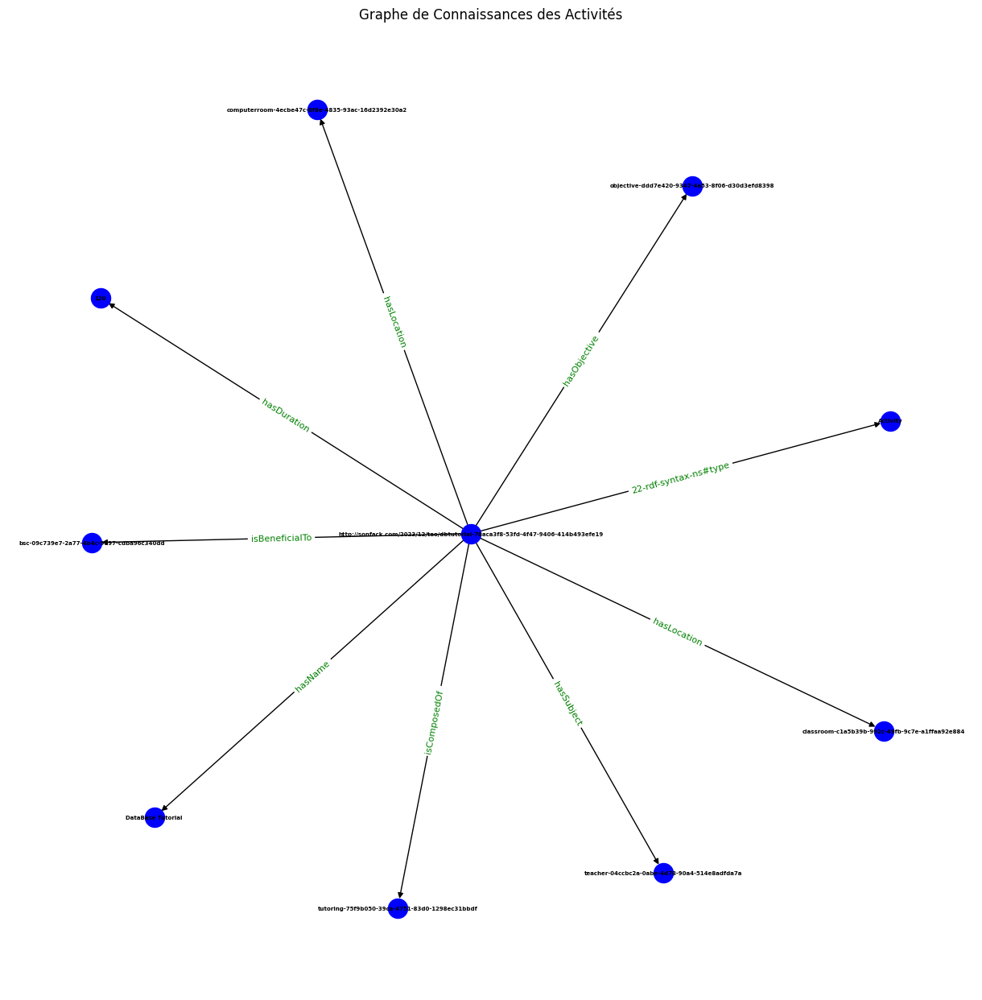

http://sonfack.com/2023/12/tao/pycourse-3f993bf5-1c2f-4f58-b85a-7b6b92bcf64b
{'http://www.w3.org/1999/02/22-rdf-syntax-ns#type': ['http://sonfack.com/2023/12/cao/Activity'], 'http://sonfack.com/2023/12/tao/hasName': ['Python Course'], 'http://sonfack.com/2023/12/cao/hasTime': ['http://sonfack.com/2023/12/tao/8AM-10AM-0ea7a574-e6be-4dc7-abe1-85a6b8ce2e3d'], 'http://sonfack.com/2023/12/tao/hasObjective': ['http://sonfack.com/2023/12/tao/objective-969f073e-1e01-4ad0-a0f0-fb806ba5a50e'], 'http://sonfack.com/2023/12/tao/hasLocation': ['http://sonfack.com/2023/12/tao/computerroom-5a2454c8-c664-401c-86b7-425e75dddc39', 'http://sonfack.com/2023/12/tao/tutorialroom-351e99f6-c93b-4377-b987-511652d2eefe'], 'http://sonfack.com/2023/12/tao/isFollowedBy': ['http://sonfack.com/2023/12/tao/pypractical-f18f0361-3f12-4b3d-9459-ce2a019b4668'], 'http://sonfack.com/2023/12/tao/isComposedOf': ['http://sonfack.com/2023/12/tao/lecturing-5737c363-39a6-405a-87d1-9f15bee9e464'], 'http://sonfack.com/2023/12/tao/i

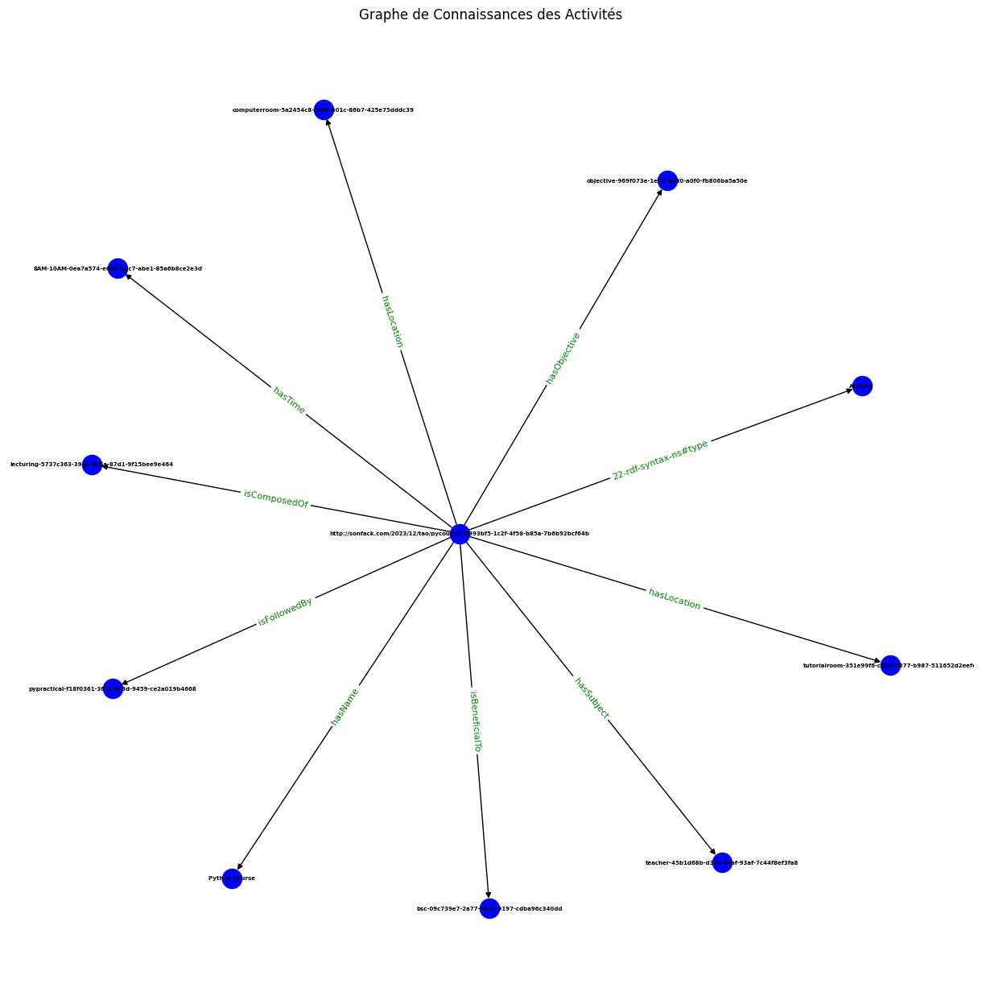

http://sonfack.com/2023/12/tao/pypractical-f18f0361-3f12-4b3d-9459-ce2a019b4668
{'http://www.w3.org/1999/02/22-rdf-syntax-ns#type': ['http://sonfack.com/2023/12/cao/Activity'], 'http://sonfack.com/2023/12/tao/hasName': ['Python Practical'], 'http://sonfack.com/2023/12/tao/hasRule': ['http://sonfack.com/2023/12/tao/rule-cdc19603-45e5-4c06-8d5a-47624147f67e'], 'http://sonfack.com/2023/12/cao/hasTime': ['http://sonfack.com/2023/12/tao/8AM-10AM-1470781d-1128-4f43-ab61-4088953f071a'], 'http://sonfack.com/2023/12/tao/hasObjective': ['http://sonfack.com/2023/12/tao/objective-969f073e-1e01-4ad0-a0f0-fb806ba5a50e'], 'http://sonfack.com/2023/12/tao/hasLocation': ['http://sonfack.com/2023/12/tao/computerroom-5a2454c8-c664-401c-86b7-425e75dddc39', 'http://sonfack.com/2023/12/tao/tutorialroom-351e99f6-c93b-4377-b987-511652d2eefe'], 'http://sonfack.com/2023/12/tao/isComposedOf': ['http://sonfack.com/2023/12/tao/practical-fa779b89-5ec8-48f1-b5c3-bda3968382ca'], 'http://sonfack.com/2023/12/tao/isBenef

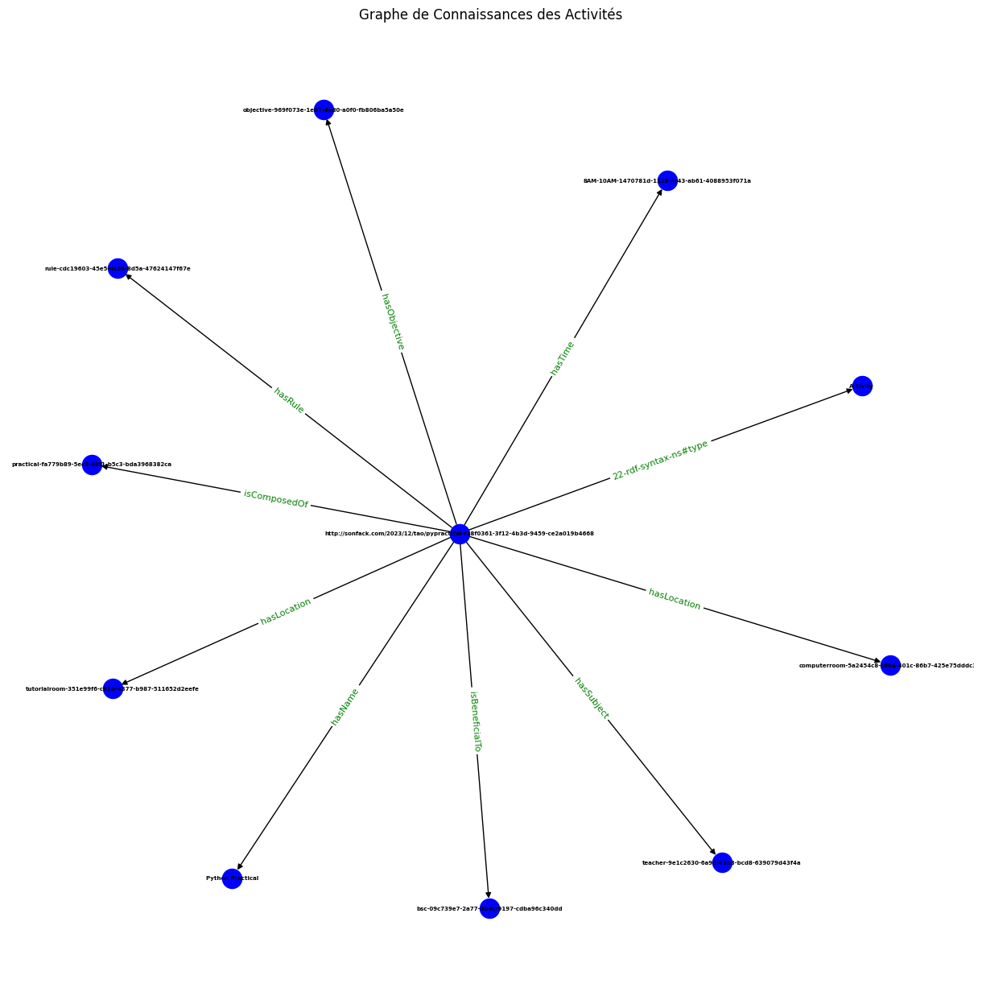

http://sonfack.com/2023/12/tao/uicourse-eaf2d283-4eb8-4024-a2c5-539984984fdd
{'http://www.w3.org/1999/02/22-rdf-syntax-ns#type': ['http://sonfack.com/2023/12/cao/Activity'], 'http://sonfack.com/2023/12/tao/hasName': ['UserInterface Course'], 'http://sonfack.com/2023/12/cao/hasTime': ['http://sonfack.com/2023/12/tao/10AM-12AM-6ab82d7d-72dc-40f2-a209-8bc6b4bb04e7'], 'http://sonfack.com/2023/12/tao/hasObjective': ['http://sonfack.com/2023/12/tao/objective-9a59e20a-60f0-4798-8895-50f6b79621c5'], 'http://sonfack.com/2023/12/tao/hasLocation': ['http://sonfack.com/2023/12/tao/computerroom-9cd6c49c-e52f-48ef-9d23-d868af4802c4', 'http://sonfack.com/2023/12/tao/classroom-9b1749fc-8ce7-42ce-89d6-4e7ff8b826c7'], 'http://sonfack.com/2023/12/tao/isComposedOf': ['http://sonfack.com/2023/12/tao/lecturing-5923c0c5-fe15-4cf9-8dc1-e3f5e73ba02a'], 'http://sonfack.com/2023/12/tao/isBeneficialTo': ['http://sonfack.com/2023/12/tao/bsc-a00ac66e-e5df-4a66-9691-42d318700616'], 'http://sonfack.com/2023/12/tao/ha

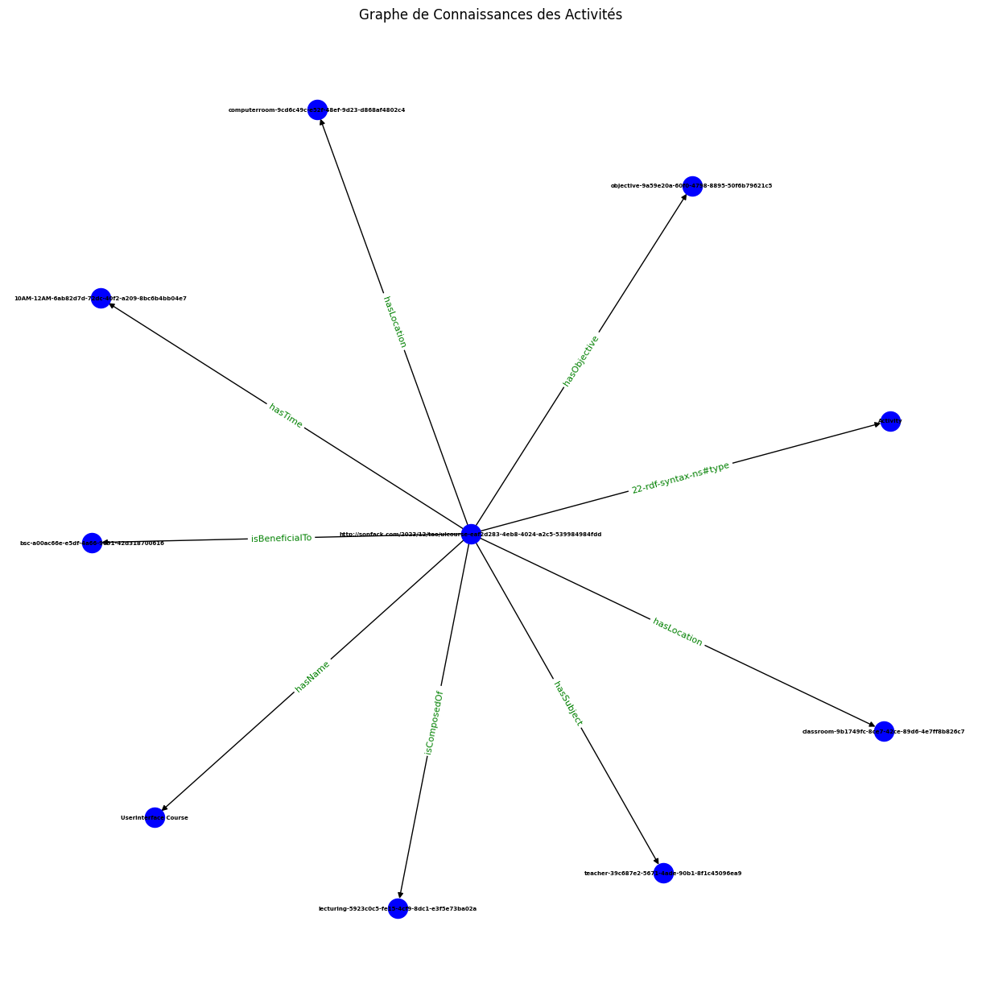

http://sonfack.com/2023/12/tao/pmcourse-adee0f07-9e90-412b-95d4-b45d7a7476bb
{'http://www.w3.org/1999/02/22-rdf-syntax-ns#type': ['http://sonfack.com/2023/12/cao/Activity'], 'http://sonfack.com/2023/12/tao/hasName': ['ProjectManagement Course'], 'http://sonfack.com/2023/12/cao/hasTime': ['http://sonfack.com/2023/12/tao/8AM-10AM-b139b467-7fbf-4298-9338-fa372b608e5e'], 'http://sonfack.com/2023/12/tao/hasObjective': ['http://sonfack.com/2023/12/tao/objective-0b6e8fa9-d03d-4636-ab9c-b34578b4ea45'], 'http://sonfack.com/2023/12/tao/hasLocation': ['http://sonfack.com/2023/12/tao/classroom-3414ff41-3e7a-44de-a679-baac1ab873c2'], 'http://sonfack.com/2023/12/tao/isComposedOf': ['http://sonfack.com/2023/12/tao/lecturing-12b5c207-f470-4bf3-bb3d-e6b31c954954'], 'http://sonfack.com/2023/12/tao/isBeneficialTo': ['http://sonfack.com/2023/12/tao/bsc-410688e8-e5d3-4e9c-9ca4-c28bf92827af']}
affichage des informations {'http://www.w3.org/1999/02/22-rdf-syntax-ns#type': ['http://sonfack.com/2023/12/cao/Act

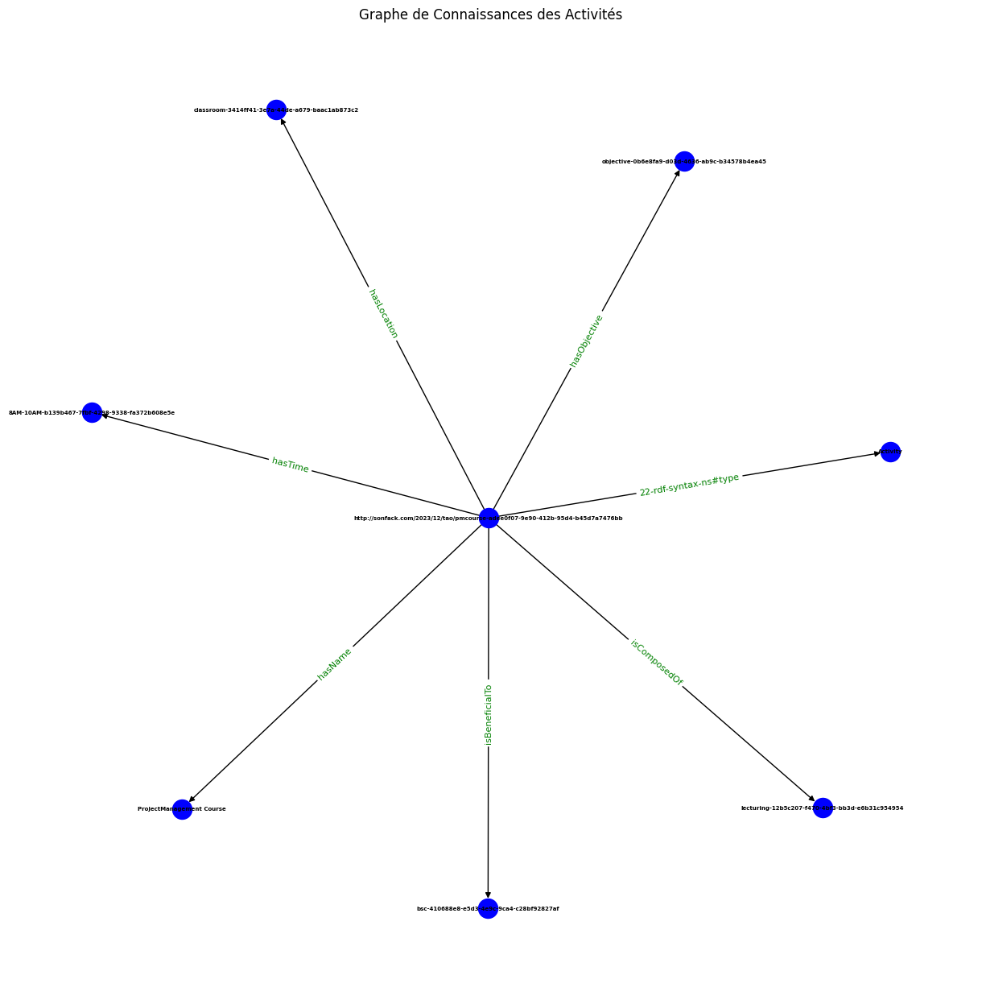

http://sonfack.com/2023/12/tao/secourse-511f491d-ea2b-428f-900e-604ea778dab5
{'http://www.w3.org/1999/02/22-rdf-syntax-ns#type': ['http://sonfack.com/2023/12/cao/Activity'], 'http://sonfack.com/2023/12/tao/hasName': ['SoftwareEng Course'], 'http://sonfack.com/2023/12/cao/hasDuration': ['120'], 'http://sonfack.com/2023/12/tao/hasObjective': ['http://sonfack.com/2023/12/tao/objective-f4de69e1-e2ba-41a6-a268-803293e73080'], 'http://sonfack.com/2023/12/tao/hasLocation': ['http://sonfack.com/2023/12/tao/classroom-25eafa60-5f87-4e1f-9609-93bcdcfbb0c9'], 'http://sonfack.com/2023/12/tao/isFollowedBy': ['http://sonfack.com/2023/12/tao/setutorial-adbef907-11e0-40c1-8dd2-37eb02899ea9'], 'http://sonfack.com/2023/12/tao/isBeneficialTo': ['http://sonfack.com/2023/12/tao/bsc-410688e8-e5d3-4e9c-9ca4-c28bf92827af'], 'http://sonfack.com/2023/12/tao/isComposedOf': ['http://sonfack.com/2023/12/tao/lecturing-14868c21-cca2-436b-9ccc-23c411ab22ca'], 'http://sonfack.com/2023/12/tao/hasSubject': ['http://sonfa

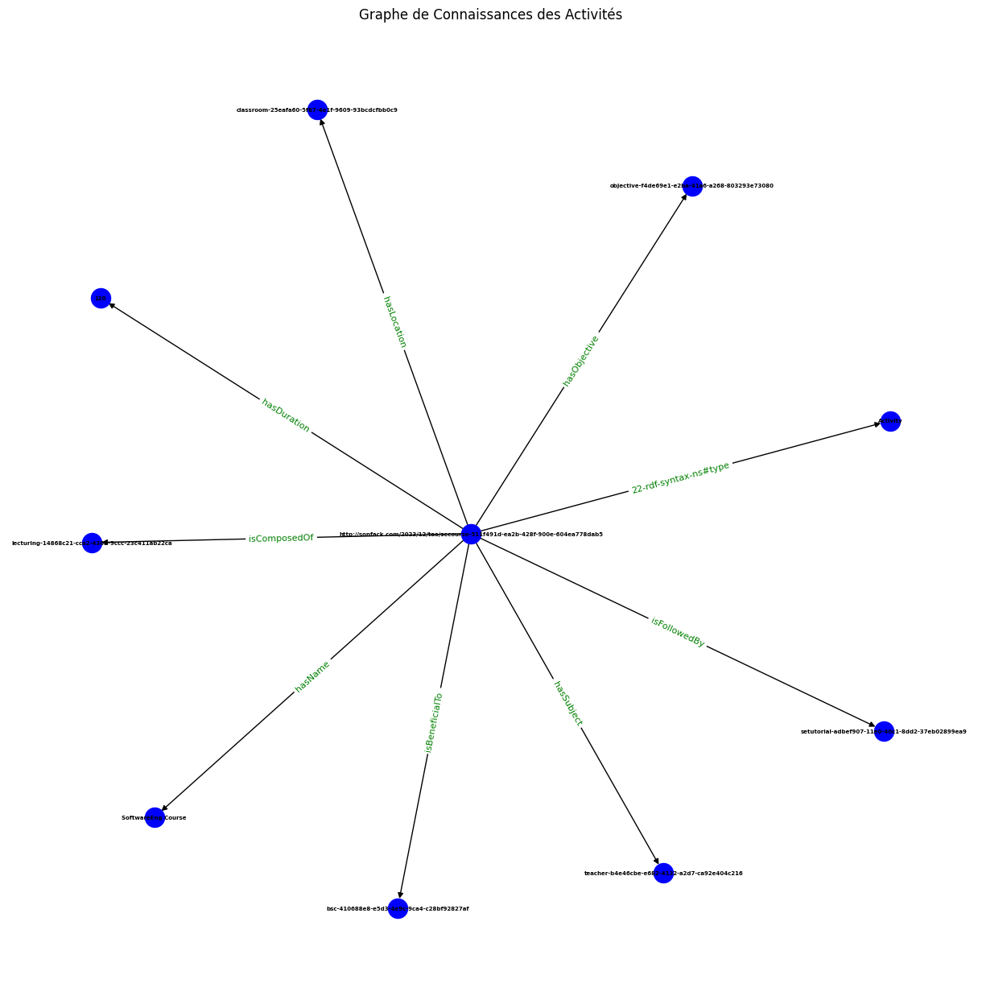

http://sonfack.com/2023/12/tao/setutorial-adbef907-11e0-40c1-8dd2-37eb02899ea9
{'http://www.w3.org/1999/02/22-rdf-syntax-ns#type': ['http://sonfack.com/2023/12/cao/Activity'], 'http://sonfack.com/2023/12/tao/hasName': ['SoftwareEng Tutorial'], 'http://sonfack.com/2023/12/cao/hasDuration': ['120'], 'http://sonfack.com/2023/12/tao/hasObjective': ['http://sonfack.com/2023/12/tao/objective-f4de69e1-e2ba-41a6-a268-803293e73080'], 'http://sonfack.com/2023/12/tao/hasLocation': ['http://sonfack.com/2023/12/tao/tutorialroom-351e99f6-c93b-4377-b987-511652d2eefe'], 'http://sonfack.com/2023/12/tao/isFollowedBy': ['http://sonfack.com/2023/12/tao/sepractical-88ca540f-fd64-4a3c-92fd-590a12f1f46b'], 'http://sonfack.com/2023/12/tao/isComposedOf': ['http://sonfack.com/2023/12/tao/tutoring-bb6311ad-c7a3-412c-84f1-4f5cf76b4a75'], 'http://sonfack.com/2023/12/tao/isBeneficialTo': ['http://sonfack.com/2023/12/tao/bsc-410688e8-e5d3-4e9c-9ca4-c28bf92827af'], 'http://sonfack.com/2023/12/tao/hasSubject': ['http:

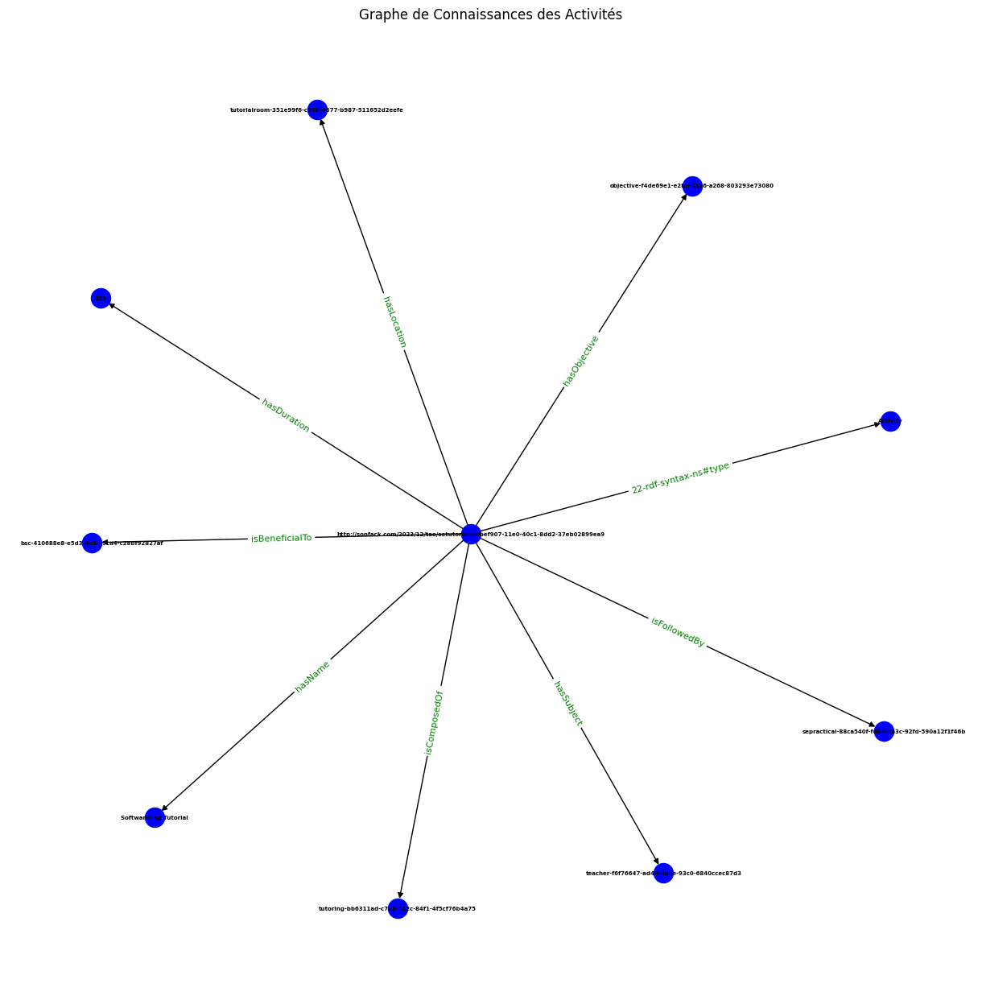

http://sonfack.com/2023/12/tao/sepractical-88ca540f-fd64-4a3c-92fd-590a12f1f46b
{'http://www.w3.org/1999/02/22-rdf-syntax-ns#type': ['http://sonfack.com/2023/12/cao/Activity'], 'http://sonfack.com/2023/12/tao/hasName': ['SoftwareEng Practical'], 'http://sonfack.com/2023/12/tao/hasRule': ['http://sonfack.com/2023/12/tao/rule-cdc19603-45e5-4c06-8d5a-47624147f67e'], 'http://sonfack.com/2023/12/cao/hasTime': ['http://sonfack.com/2023/12/tao/10AM-12AM-f4e589a5-aac9-42b7-b498-706732141ca1'], 'http://sonfack.com/2023/12/tao/hasObjective': ['http://sonfack.com/2023/12/tao/objective-f4de69e1-e2ba-41a6-a268-803293e73080'], 'http://sonfack.com/2023/12/tao/hasLocation': ['http://sonfack.com/2023/12/tao/computerroom-5a2454c8-c664-401c-86b7-425e75dddc39'], 'http://sonfack.com/2023/12/tao/isFollowedBy': ['http://sonfack.com/2023/12/tao/seproject-d3e90a3c-f550-45eb-b00e-59a3c6120318'], 'http://sonfack.com/2023/12/tao/isBeneficialTo': ['http://sonfack.com/2023/12/tao/bsc-410688e8-e5d3-4e9c-9ca4-c28bf92

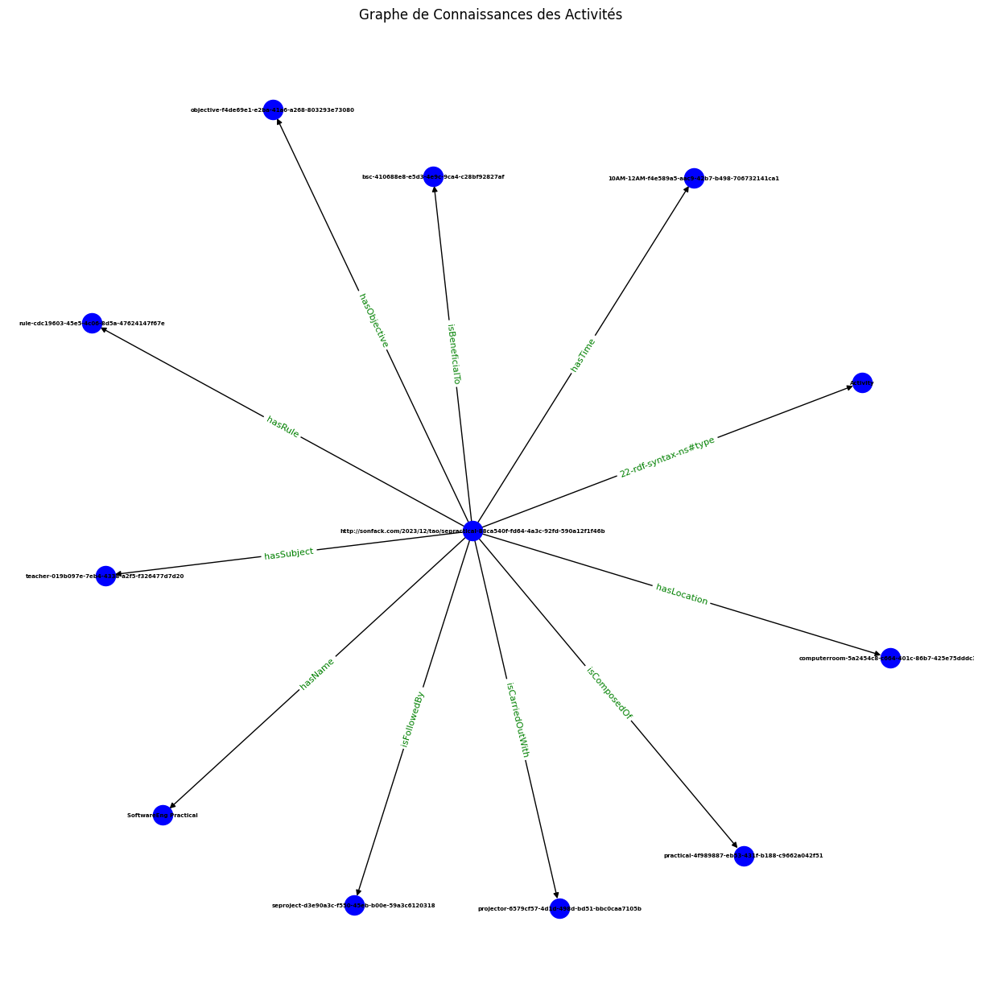

http://sonfack.com/2023/12/tao/seproject-d3e90a3c-f550-45eb-b00e-59a3c6120318
{'http://www.w3.org/1999/02/22-rdf-syntax-ns#type': ['http://sonfack.com/2023/12/cao/Activity'], 'http://sonfack.com/2023/12/tao/hasName': ['SoftwareEng Project'], 'http://sonfack.com/2023/12/cao/hasDuration': ['180'], 'http://sonfack.com/2023/12/tao/hasObjective': ['http://sonfack.com/2023/12/tao/objective-f4de69e1-e2ba-41a6-a268-803293e73080'], 'http://sonfack.com/2023/12/tao/hasLocation': ['http://sonfack.com/2023/12/tao/computerroom-5a2454c8-c664-401c-86b7-425e75dddc39'], 'http://sonfack.com/2023/12/tao/isBeneficialTo': ['http://sonfack.com/2023/12/tao/bsc-410688e8-e5d3-4e9c-9ca4-c28bf92827af'], 'http://sonfack.com/2023/12/tao/isCarriedOutWith': ['http://sonfack.com/2023/12/tao/projector-6579cf57-4d1d-498d-bd51-bbc0caa7105b'], 'http://sonfack.com/2023/12/tao/isComposedOf': ['http://sonfack.com/2023/12/tao/supervision-b45158d0-f812-4ee9-976b-809df57824f2'], 'http://sonfack.com/2023/12/tao/hasSubject': ['ht

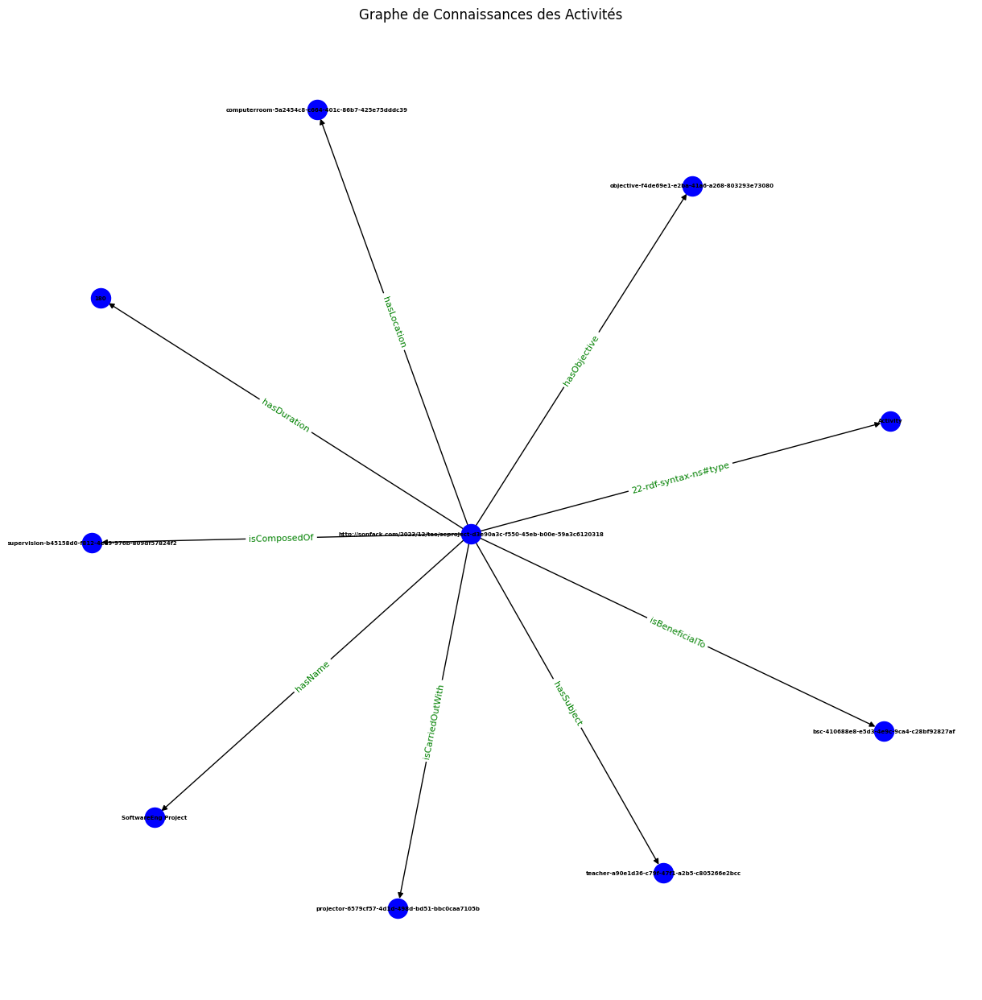

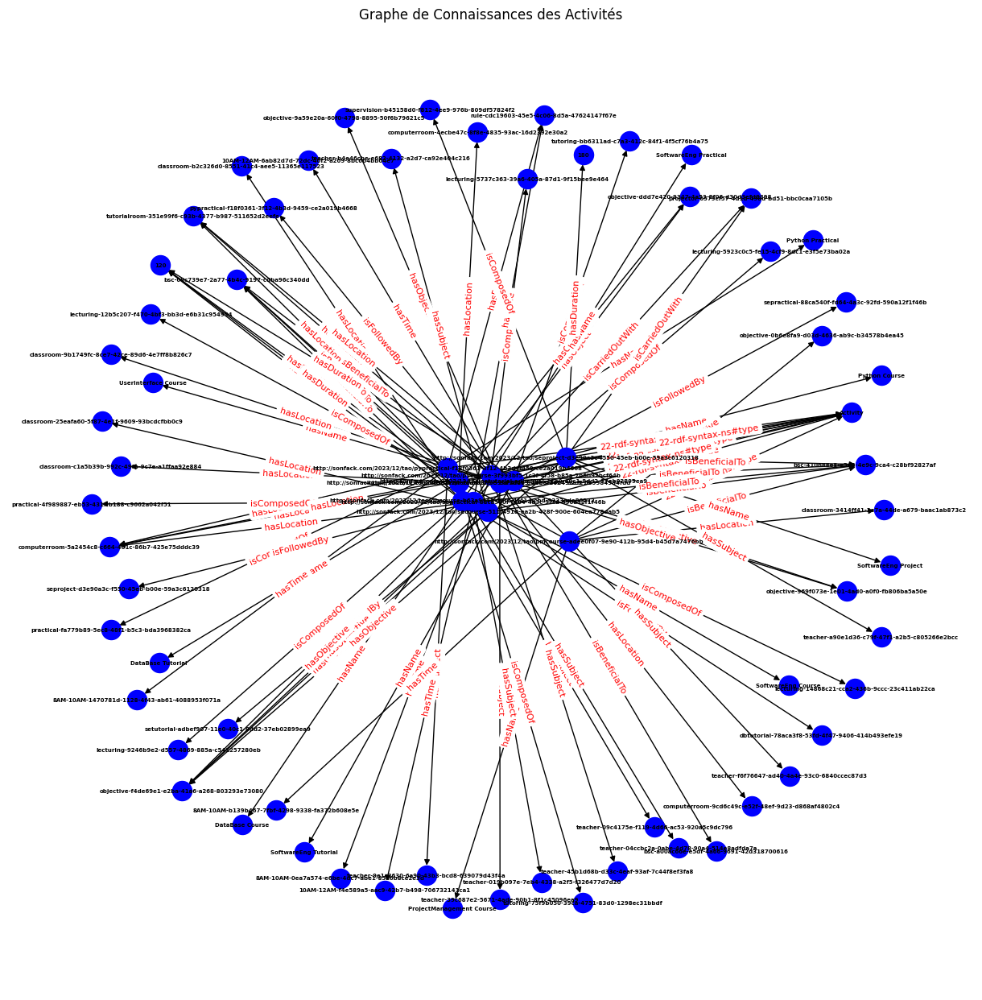

In [160]:
liste_activity = read_all_activities(g, as_str=True)
print(liste_activity)
for activity in liste_activity:
  subj = activity.split('/')[-1]
  info_activity = read_akg_node(subj, g, as_str=True)
  print(info_activity)
  add_activity_to_nxgraph(G,activity,info_activity)

# Visualize the graph
plt.figure(figsize=(12, 12))

# Generate positions for nodes using a layout algorithm
pos = nx.spring_layout(G, seed=42)

# Draw the nodes and edges
nx.draw(G, pos, with_labels=True, node_size=300, node_color="blue", font_size=5, font_weight="bold", edge_color="black")

# Draw edge labels
edge_labels = nx.get_edge_attributes(G, 'label')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='red', font_size=8)

# Show plot
plt.title("Graphe de Connaissances des Activités")
plt.show()


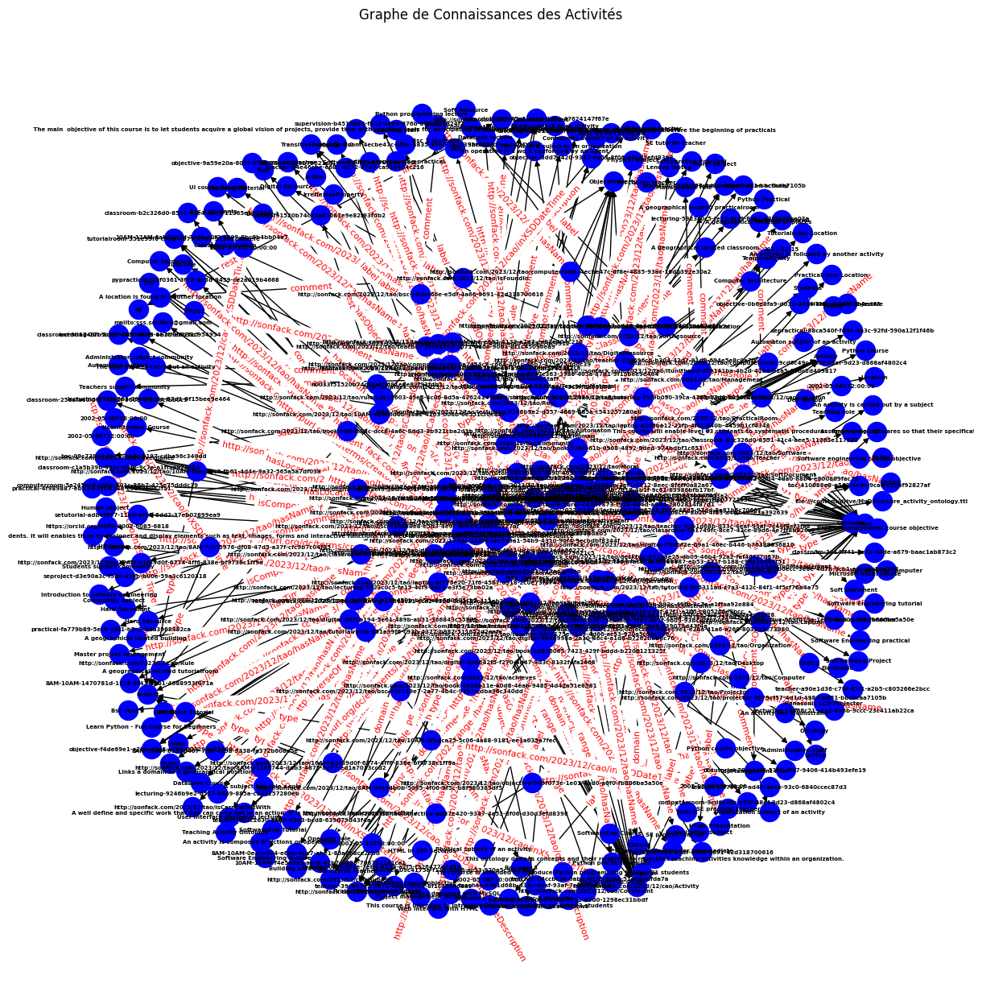

In [161]:


# Define namespace and type for entities (adjust as needed)
TAO = Namespace("http://sonfack.com/2024/01/tao#")  # Replace with your actual namespace

# Initialize NetworkX graph
#G = nx.DiGraph()
graph = Graph()
graph.parse("/content/drive/MyDrive/teaching_akg.ttl", format="ttl")


# Using directed graph to capture the direction of relationships
# Extract and add relevant assertions to the graph
for subj, pred, obj in graph:
    if not str(pred).startswith("http://sonfack.com/2024/01/tao#has") and not str(pred).startswith("http://sonfack.com/2024/01/tao#is"):
        subj_label = subj.split('#')[-1]
        pred_label = pred.split('#')[-1]
        obj_label = obj.split('#')[-1]
        G.add_node(subj_label)  # Add subject node
        G.add_node(obj_label)   # Add object node
        G.add_edge(subj_label, obj_label, label=pred_label)  # Add edge with predicate as label

# Visualize the graph
plt.figure(figsize=(12, 12))

# Generate positions for nodes using a layout algorithm
pos = nx.spring_layout(G, seed=42)

# Draw the nodes and edges
nx.draw(G, pos, with_labels=True, node_size=300, node_color="blue", font_size=5, font_weight="bold", edge_color="black")

# Draw edge labels
edge_labels = nx.get_edge_attributes(G, 'label')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='red', font_size=8)

# Show plot
plt.title("Graphe de Connaissances des Activités")
plt.show()


In [162]:
!pip install python-louvain


In [163]:
from community import community_louvain

import networkx as nx
from community import community_louvain

# Convertir le graphe en non dirigé
G_undirected = G.to_undirected()

# Appliquer l'algorithme de Louvain
partitions = community_louvain.best_partition(G_undirected)

# Afficher le nombre de communautés détectées
print(f"Nombre de communautés détectées: {len(set(partitions.values()))}")


Nombre de communautés détectées: 14


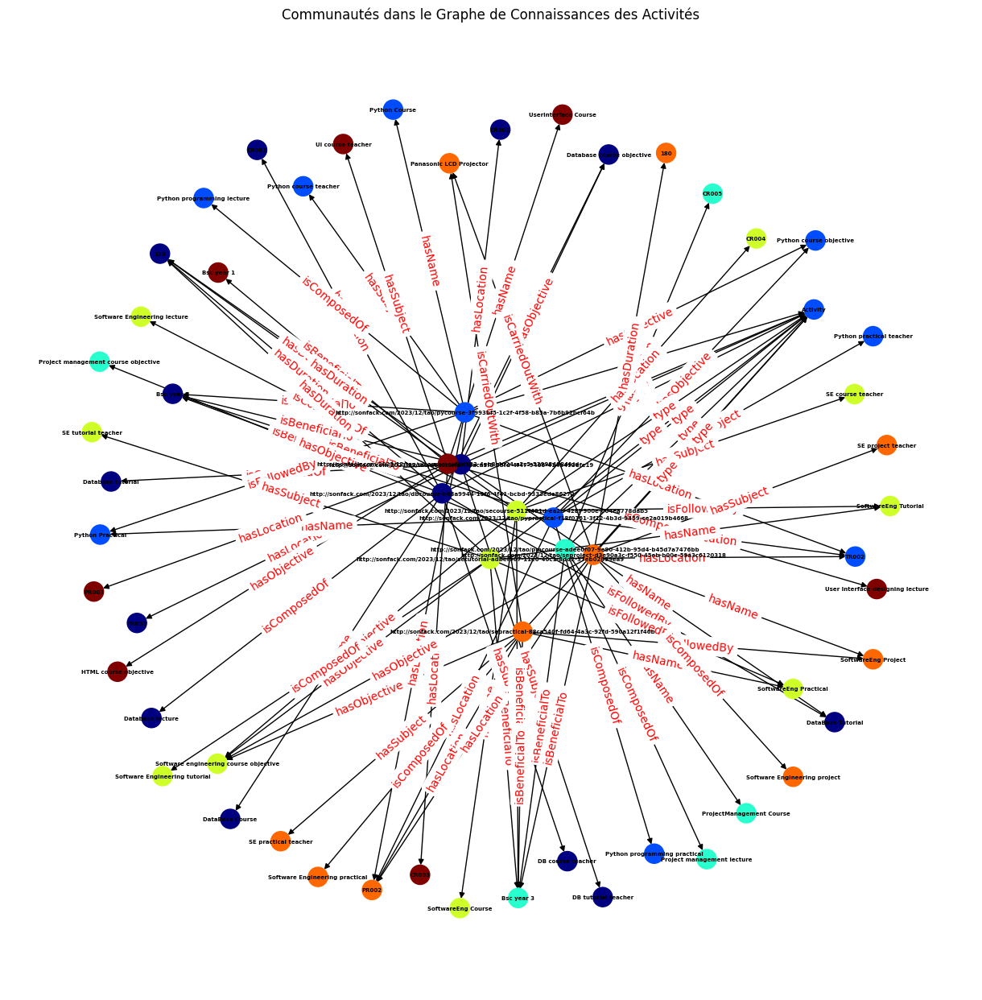

In [164]:


def read_all_activities(akg: Graph, as_str=True) -> list:
    """Retourne toutes les activités d'un graphe de connaissances."""
    activities_list = [str(activity) if as_str else activity for activity in akg.subjects(predicate=RDF.type, object=cao_namespace.Activity, unique=True)]
    return activities_list

def read_akg_node(node_uri: str, akg: Graph, as_str=True) -> dict:
    """Retourne tous les éléments directement liés à un nœud du graphe."""
    activity_info = {}
    activity_uri_ref = f"{akg_namespace}{node_uri}"
    for act_predicate, act_object in akg.predicate_objects(subject=URIRef(activity_uri_ref)):
        pred = act_predicate
        obj = act_object
        if as_str:
            pred = str(act_predicate)
            obj = str(act_object)
        if pred in activity_info:
            existing_objects = activity_info[pred] + [obj]
            activity_info[pred] = existing_objects
        else:
            activity_info[pred] = [obj]
    return activity_info

def add_activity_to_nxgraph(G, activity_uri, activity_info):
    """Ajoute les activités et leurs relations au graphe NetworkX."""
    for pred, obj_list in activity_info.items():
        pred_label = pred.split('/')[-1]
        if '#' in pred_label:
            pred_label = pred_label.split('#')[1]

        for obj in obj_list:
            obj_label = obj.split('/')[-1]
            node_info = read_akg_node(obj_label, graph)

            if node_info:
                # Assurez-vous que vous récupérez une chaîne et non une liste
                obj_label = node_info.get('http://sonfack.com/2023/12/tao/hasName', [None])[0]
                if obj_label is None:
                    continue

            G.add_node(activity_uri)
            G.add_node(obj_label)
            G.add_edge(activity_uri, obj_label, label=pred_label)

def visualize_activity(G):
    """Visualiser le graphe de connaissances."""
    plt.figure(figsize=(12, 12))
     # Utiliser une palette de couleurs pour les différentes communautés
    community_colors = [f"C{community_id % 10}" for community_id in partition.values()]

    pos = nx.spring_layout(G, seed=42)
     # Dessiner les nœuds avec les couleurs de la communauté
    nx.draw_networkx_nodes(G, pos, node_color=community_colors, node_size=300, cmap=plt.cm.Set1)


     # Dessiner les nœuds avec les couleurs de la communauté
    nx.draw_networkx_nodes(G, pos, node_color=community_colors, node_size=300, cmap=plt.cm.Set1)

    # Afficher les labels des arêtes
    nx.draw(G, pos, with_labels=True, node_size=300, node_color="blue", font_size=5, font_weight="bold", edge_color="black")
     # Dessiner les arêtes
    nx.draw_networkx_edges(G, pos, edge_color="gray", alpha=0.5)

    # Afficher les labels des nœuds
    edge_labels = nx.get_edge_attributes(G, 'label')
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='bold', font_size=10)
    plt.title("Graphe de Connaissances des Activités")
    plt.show()

# Charger le fichier RDF dans un graphe NetworkX
G = nx.DiGraph()

# Lire toutes les activités
liste_activity = read_all_activities(graph, as_str=True)

# Ajouter chaque activité au graphe
for activity in liste_activity:
    subj = activity.split('/')[-1]
    info_activity = read_akg_node(subj, graph, as_str=True)
    add_activity_to_nxgraph(G, activity, info_activity)

# Détection des communautés
partition = community_louvain.best_partition(G.to_undirected())

# Visualiser les communautés
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, seed=42)
colors = [partition[node] for node in G.nodes()]
nx.draw(G, pos, node_color=colors, with_labels=True, node_size=300, cmap=plt.cm.jet, font_size=5, font_weight="bold", edge_color="black")
edge_labels = nx.get_edge_attributes(G, 'label')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='red', font_size=10)
plt.title("Communautés dans le Graphe de Connaissances des Activités")
plt.show()



In [165]:

# Initialiser un graphe orienté
G = nx.DiGraph()
# Exemples d'activité et d'informations à ajouter (à ajuster selon vos données)
activity_uri = "http://example.com/activity1"
activity_info = {
    "http://example.com/predicate1": ["http://example.com/object1", "http://example.com/object2"],
    "http://example.com/predicate2": ["http://example.com/object3"]
}


# Parcourez le graphe RDF et ajoutez les nœuds et arêtes dans G
for subj, pred, obj in graph:
    if not str(pred).startswith("http://sonfack.com/2024/01/tao#has") and not str(pred).startswith("http://sonfack.com/2024/01/tao#is"):
        subj_label = subj.split('#')[-1]
        pred_label = pred.split('#')[-1]
        obj_label = obj.split('#')[-1]
        G.add_node(subj_label)  # Ajouter un nœud pour le sujet
        G.add_node(obj_label)   # Ajouter un nœud pour l'objet
        G.add_edge(subj_label, obj_label, label=pred_label)  # Ajouter une arête avec le prédicat comme étiquette

print(f"Nombre de nœuds : {G.number_of_nodes()}")
print(f"Nombre d'arêtes : {G.number_of_edges()}")


Nombre de nœuds : 314
Nombre d'arêtes : 489


In [166]:
from rdflib import Graph, RDF, Namespace
import re

# Assurez-vous d'avoir défini les namespaces appropriés
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")
tao_namespace = Namespace("http://sonfack.com/2023/12/tao/")

def get_all_activities(akg: Graph) -> list:
    """Retourne une liste de toutes les activités dans le graphe RDF."""
    activities = [str(activity) for activity in akg.subjects(predicate=RDF.type, object=cao_namespace.Activity, unique=True)]
    return activities

def extract_name_without_identifiers(uri: str, namespace: str) -> str:
    """Extrait le nom de l'activité sans les identifiants de l'URI après le namespace."""
    match = re.match(f"{re.escape(namespace)}(.+?)(?:[-_].*)?$", uri)
    if match:
        name_without_identifiers = match.group(1).replace('-', ' ').replace('_', ' ').title()
        return name_without_identifiers
    return uri

# Récupérer et afficher les noms des activités
all_activities = get_all_activities(graph)
print("Liste de toutes les activités :")
for activity in all_activities:
    activity_name = extract_name_without_identifiers(activity, "http://sonfack.com/2023/12/tao/")
    print(activity_name)






Liste de toutes les activités :
Dbcourse
Dbtutorial
Pycourse
Pypractical
Uicourse
Pmcourse
Secourse
Setutorial
Sepractical
Seproject


In [167]:
# Requête SPARQL pour récupérer les activités qui ont des objets uniques
query = """
PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
PREFIX cao: <http://sonfack.com/2023/12/cao/>
PREFIX tao: <http://sonfack.com/2023/12/tao/>

SELECT DISTINCT ?subj
WHERE {
    ?subj ?pred ?obj .
    FILTER NOT EXISTS {
        ?otherSubj ?pred ?obj .
        FILTER (?otherSubj != ?subj) # Vérifie si l'objet est utilisé par un autre sujet
    }
}
"""

# Exécution de la requête SPARQL
results = graph.query(query)

# Extraction et affichage des noms des activités
print("Activités avec des objets uniques :")
for row in results:
    activity_name = extract_name_without_identifiers(str(row.subj), "http://sonfack.com/2023/12/tao/")
    print(activity_name)

Activités avec des objets uniques :
Physical
10Am
12Am
Tutoring
10Am
Desktop
Dbtutorial
Pypractical
Computerroom
Sepractical
http://sonfack.com/2023/12/cao/Operation
8Am
Setutorial
Community
Teacher
Tutor
Objective
Uicourse
Teacher
Projector
http://sonfack.com/2023/12/cao/Location
Objective
Isfollowedby
Laptop
Electronic
Teacher
Hasconstraint
Iscomposedof
Pmcourse
Teacher
Objective
Book
Topmanagement
Bsc
Bsc
Harddocument
http://sonfack.com/2024/01/tao#
Teacher
Objective
Tutoring
Tutorialroom
Dbcourse
Projector
Moral
Laptop
Pycourse
http://sonfack.com/2023/12/cao/Action
Teacher
Teachingmaterial
Book
Organization
Lecturer
Tutorialroom
Management
Computerroom
Tutor
8Am
n0033f51520b74c28a65681e9e82f93fdb2
Supervisor
Hasrole
Seproject
Lecturing
Teachingstaff
Human
Book
Lecturer
Digital
Book
Lecturing
Iscarriedoutby
n0033f51520b74c28a65681e9e82f93fdb1
Practicalroom
8Am
Lecturing
Software
Book
Book
Classroom
Secourse
Teacher
Isusedfor
Lecturing
10Am
10Am
Digital
Operator
Lecturer
Classroom
Ru

In [168]:
from rdflib import Graph
import re

def extract_name(uri: str) -> str:
    """Extrait le nom sans l'URI en supprimant le namespace."""
    return re.sub(r'.*[#/]', '', uri)  # Supprime tout ce qui précède '/' ou '#'

def akg_simplified():
    # Charger le graphe RDF
    simplified_graph = Graph()
    akg_file = "/content/drive/MyDrive/teaching_akg.ttl"
    simplified_graph.parse(akg_file, format="turtle")  # Assurez-vous du bon format (ttl)

    # Requête SPARQL pour récupérer les activités avec des objets uniques
    query = """
      PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
      PREFIX owl: <http://www.w3.org/2002/07/owl#>
      PREFIX rdfs: <http://www.w3.org/2000/01/rdf-schema#>
      PREFIX xsd: <http://www.w3.org/2001/XMLSchema#>
      PREFIX tao: <http://sonfack.com/2023/12/tao/>
      PREFIX cao: <http://sonfack.com/2023/12/cao/>

      SELECT DISTINCT ?s ?pro ?obj
      WHERE {
          {
          SELECT ?s
          WHERE {
              ?s rdf:type ?o .
              ?o rdf:type owl:Class .
          }
          }
          ?s ?pro ?obj .
          FILTER (?obj  != owl:NamedIndividual)
      }
      """

    list_edge = []
    # Exécution de la requête SPARQL
    akg_result = simplified_graph.query(query)

    for quad in akg_result:
        subject = extract_name(str(quad[0]))  # Nettoyer l'URI du sujet
        predicate = extract_name(str(quad[1]))  # Nettoyer l'URI du prédicat
        obj = extract_name(str(quad[2]))  # Nettoyer l'URI de l'objet

        list_edge.append((subject, predicate, obj))

    print("Liste des relations simplifiées :")
    for edge in list_edge:
        print(edge)  # Affichage des résultats sans URI

# Exécuter la fonction
akg_simplified()


Liste des relations simplifiées :
('lecturing-9246b9e2-d557-4869-885a-c541257280eb', 'type', 'Action')
('lecturing-9246b9e2-d557-4869-885a-c541257280eb', 'hasName', 'Database lecture')
('lecturing-9246b9e2-d557-4869-885a-c541257280eb', 'isCarriedOutBy', 'teacher-09c4175e-f119-4d66-ac53-920a5c9dc796')
('lecturing-5737c363-39a6-405a-87d1-9f15bee9e464', 'type', 'Action')
('lecturing-5737c363-39a6-405a-87d1-9f15bee9e464', 'hasName', 'Python programming lecture')
('lecturing-5737c363-39a6-405a-87d1-9f15bee9e464', 'isCarriedOutBy', 'teacher-45b1d68b-d33c-4eaf-93af-7c44f8ef3fa8')
('lecturing-5923c0c5-fe15-4cf9-8dc1-e3f5e73ba02a', 'type', 'Action')
('lecturing-5923c0c5-fe15-4cf9-8dc1-e3f5e73ba02a', 'hasName', 'User Interface designing lecture')
('lecturing-5923c0c5-fe15-4cf9-8dc1-e3f5e73ba02a', 'isCarriedOutBy', 'teacher-39c687e2-5671-4ade-90b1-8f1c45096ea9')
('lecturing-12b5c207-f470-4bf3-bb3d-e6b31c954954', 'type', 'Action')
('lecturing-12b5c207-f470-4bf3-bb3d-e6b31c954954', 'hasName', 'Proj

In [169]:
from rdflib import Graph, Namespace

def get_subjects_objects():
    # Charger le graphe RDF
    akg_file = "/content/drive/MyDrive/teaching_akg.ttl"
    graph = Graph()
    graph.parse(akg_file, format="turtle")  # Assurez-vous du bon format (ttl)

    # Définition des namespaces
    cao = Namespace("http://sonfack.com/2023/12/cao/")
    rdfs = Namespace("http://www.w3.org/2000/01/rdf-schema#")
    rdf  = Namespace("http://www.w3.org/1999/02/22-rdf-syntax-ns#")

    # Requête SPARQL pour récupérer les sujets (activités) et leurs objets
    query = """
    PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
    PREFIX rdfs: <http://www.w3.org/2000/01/rdf-schema#>
    PREFIX cao: <http://sonfack.com/2023/12/cao/>

    SELECT DISTINCT ?subject ?label_s ?predicate ?object ?label_o
    WHERE {
        ?subject a cao:Activity .
        ?subject ?predicate ?object .
        FILTER (?predicate != rdf:type)

        OPTIONAL { ?subject rdfs:label ?label_s }
        OPTIONAL { ?object rdfs:label ?label_o }
    }
    """

    # Exécuter la requête
    results = graph.query(query)

    # Stocker les résultats sous forme de liste de tuples
    subject_object_list = []

    for row in results:
        subject = row.label_s if row.label_s else row.subject  # Prend le label si dispo, sinon URI
        predicate = row.predicate
        object_ = row.label_o if row.label_o else row.object  # Prend le label si dispo, sinon URI

        subject_object_list.append((subject, predicate, object_))

    return subject_object_list

# Exécuter la fonction et afficher les résultats
relations = get_subjects_objects()

print("Liste des sujets et objets :")
for subj, pred, obj in relations:
    print(f"Sujet: {subj}, Relation: {pred}, Objet: {obj}")


Liste des sujets et objets :
Sujet: http://sonfack.com/2023/12/tao/dbcourse-b63a9944-19f6-4f41-bcbd-9333ede86272, Relation: http://sonfack.com/2023/12/tao/hasName, Objet: DataBase Course
Sujet: http://sonfack.com/2023/12/tao/dbcourse-b63a9944-19f6-4f41-bcbd-9333ede86272, Relation: http://sonfack.com/2023/12/cao/hasDuration, Objet: 120
Sujet: http://sonfack.com/2023/12/tao/dbcourse-b63a9944-19f6-4f41-bcbd-9333ede86272, Relation: http://sonfack.com/2023/12/tao/hasObject, Objet: http://sonfack.com/2023/12/tao/objective-ddd7e420-9347-4a53-8f06-d30d3efd8398
Sujet: http://sonfack.com/2023/12/tao/dbcourse-b63a9944-19f6-4f41-bcbd-9333ede86272, Relation: http://sonfack.com/2023/12/tao/hasLocation, Objet: http://sonfack.com/2023/12/tao/classroom-b2c326d0-8551-41c4-aee5-11365e117523
Sujet: http://sonfack.com/2023/12/tao/dbcourse-b63a9944-19f6-4f41-bcbd-9333ede86272, Relation: http://sonfack.com/2023/12/tao/isFollowedBy, Objet: http://sonfack.com/2023/12/tao/dbtutorial-78aca3f8-53fd-4f47-9406-414b

In [170]:
from rdflib import Graph, RDF, Namespace
import itertools
import re

# Définition des namespaces
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")
tao_namespace = Namespace("http://sonfack.com/2023/12/tao/")
rdfs = Namespace("http://www.w3.org/2000/01/rdf-schema#")
rdf = Namespace("http://www.w3.org/1999/02/22-rdf-syntax-ns#")

def extract_name_without_identifiers(uri: str, namespace: str) -> str:
    """Extrait le nom sans identifiants de l'URI après le namespace."""
    match = re.match(f"{re.escape(namespace)}(.+?)(?:[-_].*)?$", uri)
    if match:
        return match.group(1).replace('-', ' ').replace('_', ' ').title()
    return uri

def get_all_activities(graph: Graph) -> dict:
    """Retourne un dictionnaire {URI: Nom} pour toutes les activités du graphe."""
    activities = {
        str(activity): extract_name_without_identifiers(str(activity), str(tao_namespace))
        for activity in graph.subjects(predicate=RDF.type, object=cao_namespace.Activity, unique=True)
    }
    return activities

def split_subjects_objects():
    """
    Compare toutes les activités dans le dataset, récupère les objets partagés
    et sépare les activités qui ont des objets en commun de celles qui sont isolées.
    """
    # Charger le graphe RDF
    akg_file = "/content/drive/MyDrive/teaching_akg.ttl"
    graph = Graph()
    graph.parse(akg_file, format="turtle")

    # Récupérer toutes les activités
    subjects = get_all_activities(graph)

    # Comparer toutes les paires possibles d'activités
    subject_pairs = list(itertools.combinations(subjects.keys(), 2))
    shared_objects_dict = {}
    all_linked_subjects = set()

    for subj1, subj2 in subject_pairs:
        query = """
          PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
      PREFIX owl: <http://www.w3.org/2002/07/owl#>
      PREFIX rdfs: <http://www.w3.org/2000/01/rdf-schema#>
      PREFIX xsd: <http://www.w3.org/2001/XMLSchema#>
      PREFIX tao: <http://sonfack.com/2023/12/tao/>
      PREFIX cao: <http://sonfack.com/2023/12/cao/>

      SELECT ?label1 ?p ?oclass ?olabel ?label2
      WHERE {
          {
            ?object ?p ?subj1 .
            ?bject ?p ?subj2 .
            ?subj1 a cao:Activity .
            ?object rdfs:label|cao:hasName ?olabel ;
               a ?oclass .
            ?subj1 rdfs:label ?label1 .
            ?subj2 a cao:Activity .
            ?subj2 rdfs:label ?label2 .
            FILTER((?p != rdf:type) && (?subj1 != ?subj2) && (?oclass != owl:NamedIndividual))
        }
        UNION
        {
            ?subj1 ?p ?object .
            ?subj2 ?p ?object.
            ?subj1 a cao:Activity .
            ?object rdfs:label|cao:hasName ?olabel ;
               a ?oclass .
            ?subj1 rdfs:label ?label1 .
            ?subj2 a cao:Activity .
            ?subj2 rdfs:label ?label2 .
            FILTER((?p != rdf:type) && (?subj1 != ?subj2) && (?oclass != owl:NamedIndividual))
        }
    }

        """

        results = graph.query(query)
        shared_objects = [
            str(row.label_o) if row.label_o else extract_name_without_identifiers(str(row.object), str(tao_namespace))
            for row in results
        ]

        if shared_objects:
            shared_objects_dict[(subjects[subj1], subjects[subj2])] = shared_objects
            all_linked_subjects.update([subjects[subj1], subjects[subj2]])

    # Séparer les activités isolées
  #  isolated_subjects = set(subjects.values()) - all_linked_subjects

    #return shared_objects_dict, list(isolated_subjects)

# Exécuter la fonction et afficher les résultats
#shared_objects_data, isolated_activities = split_subjects_objects()

print("\n🔗 Activités qui partagent des objets :")
for (activity1, activity2), objects in shared_objects_data.items():
    print(f"\n🟢 {activity1} ↔ {activity2}")
    for obj in objects:
        print(f"   - {obj}")

print("\n🚀 Activités isolées (sans objets partagés) :")
for activity in isolated_activities:
    print(f"   - {activity}")



🔗 Activités qui partagent des objets :

🟢 Dbcourse ↔ Dbtutorial
   - 120
   - Bsc

🟢 Dbcourse ↔ Pycourse
   - Bsc

🟢 Dbcourse ↔ Pypractical
   - Bsc

🟢 Dbcourse ↔ Secourse
   - 120

🟢 Dbcourse ↔ Setutorial
   - 120

🟢 Dbtutorial ↔ Pycourse
   - Bsc

🟢 Dbtutorial ↔ Pypractical
   - Bsc

🟢 Dbtutorial ↔ Secourse
   - 120

🟢 Dbtutorial ↔ Setutorial
   - 120

🟢 Pycourse ↔ Pypractical
   - Objective
   - Computerroom
   - Tutorialroom
   - Bsc

🟢 Pycourse ↔ Setutorial
   - Tutorialroom

🟢 Pycourse ↔ Sepractical
   - Computerroom

🟢 Pycourse ↔ Seproject
   - Computerroom

🟢 Pypractical ↔ Setutorial
   - Tutorialroom

🟢 Pypractical ↔ Sepractical
   - Rule
   - Computerroom

🟢 Pypractical ↔ Seproject
   - Computerroom

🟢 Pmcourse ↔ Secourse
   - Bsc

🟢 Pmcourse ↔ Setutorial
   - Bsc

🟢 Pmcourse ↔ Sepractical
   - Bsc

🟢 Pmcourse ↔ Seproject
   - Bsc

🟢 Secourse ↔ Setutorial
   - 120
   - Objective
   - Bsc

🟢 Secourse ↔ Sepractical
   - Objective
   - Bsc

🟢 Secourse ↔ Seproject
   - Objective

In [171]:
from rdflib import Graph, RDF, Namespace
import itertools
import re

# Définition des namespaces
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")
tao_namespace = Namespace("http://sonfack.com/2023/12/tao/")
rdfs = Namespace("http://www.w3.org/2000/01/rdf-schema#")
rdf = Namespace("http://www.w3.org/1999/02/22-rdf-syntax-ns#")

def extract_name_without_identifiers(uri: str, namespace: str) -> str:
    """Extrait le nom sans identifiants de l'URI après le namespace."""
    match = re.match(f"{re.escape(namespace)}(.+?)(?:[-_].*)?$", uri)
    if match:
        return match.group(1).replace('-', ' ').replace('_', ' ').title()
    return uri

def get_all_activities(graph: Graph) -> dict:
    """Retourne un dictionnaire {URI: Nom} pour toutes les activités du graphe."""
    activities = {
        str(activity): extract_name_without_identifiers(str(activity), str(tao_namespace))
        for activity in graph.subjects(predicate=RDF.type, object=cao_namespace.Activity, unique=True)
    }
    return activities

def split_subjects_objects():
    """
    Compare toutes les activités dans le dataset, récupère les objets partagés
    et sépare les activités qui ont des objets en commun de celles qui sont isolées.
    """
    # Charger le graphe RDF
    akg_file = "/content/drive/MyDrive/teaching_akg.ttl"
    graph = Graph()
    graph.parse(akg_file, format="turtle")

    # Récupérer toutes les activités
    subjects = get_all_activities(graph)

    # Comparer toutes les paires possibles d'activités
    subject_pairs = list(itertools.combinations(subjects.keys(), 2))
    shared_objects_dict = {}
    all_linked_subjects = set()

    for subj1, subj2 in subject_pairs:
        query_shared_objects = f"""
        PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
        PREFIX rdfs: <http://www.w3.org/2000/01/rdf-schema#>
        PREFIX cao: <http://sonfack.com/2023/12/cao/>

        SELECT DISTINCT ?object ?label_o
        WHERE {{
            <{subj1}> ?p ?object .
            <{subj2}> ?p ?object .
            FILTER (?p != rdf:type)
            OPTIONAL {{ ?object rdfs:label ?label_o }}
        }}
        """

        results = graph.query(query_shared_objects)
        shared_objects = [
            str(row.label_o) if row.label_o else extract_name_without_identifiers(str(row.object), str(tao_namespace))
            for row in results
        ]

        if shared_objects:
            shared_objects_dict[(subjects[subj1], subjects[subj2])] = shared_objects
            all_linked_subjects.update([subjects[subj1], subjects[subj2]])

    # Séparer les activités isolées
    isolated_subjects = set(subjects.values()) - all_linked_subjects

    return shared_objects_dict, list(isolated_subjects)

# Exécuter la fonction et afficher les résultats
shared_objects_data, isolated_activities = split_subjects_objects()

print("\n🔗 Activités qui partagent des objets :")
for (activity1, activity2), objects in shared_objects_data.items():
    print(f"\n🟢 {activity1} ↔ {activity2}")
    for obj in objects:
        print(f"   - {obj}")

print("\n🚀 Activités isolées (sans objets partagés) :")
for activity in isolated_activities:
    print(f"   - {activity}")



🔗 Activités qui partagent des objets :

🟢 Dbcourse ↔ Dbtutorial
   - 120
   - Bsc

🟢 Dbcourse ↔ Pycourse
   - Bsc

🟢 Dbcourse ↔ Pypractical
   - Bsc

🟢 Dbcourse ↔ Secourse
   - 120

🟢 Dbcourse ↔ Setutorial
   - 120

🟢 Dbtutorial ↔ Pycourse
   - Bsc

🟢 Dbtutorial ↔ Pypractical
   - Bsc

🟢 Dbtutorial ↔ Secourse
   - 120

🟢 Dbtutorial ↔ Setutorial
   - 120

🟢 Pycourse ↔ Pypractical
   - Objective
   - Computerroom
   - Tutorialroom
   - Bsc

🟢 Pycourse ↔ Setutorial
   - Tutorialroom

🟢 Pycourse ↔ Sepractical
   - Computerroom

🟢 Pycourse ↔ Seproject
   - Computerroom

🟢 Pypractical ↔ Setutorial
   - Tutorialroom

🟢 Pypractical ↔ Sepractical
   - Rule
   - Computerroom

🟢 Pypractical ↔ Seproject
   - Computerroom

🟢 Pmcourse ↔ Secourse
   - Bsc

🟢 Pmcourse ↔ Setutorial
   - Bsc

🟢 Pmcourse ↔ Sepractical
   - Bsc

🟢 Pmcourse ↔ Seproject
   - Bsc

🟢 Secourse ↔ Setutorial
   - 120
   - Objective
   - Bsc

🟢 Secourse ↔ Sepractical
   - Objective
   - Bsc

🟢 Secourse ↔ Seproject
   - Objective


Sujets connectés :
Dbcourse ↔ Pycourse
Pypractical ↔ Seproject
Dbcourse ↔ Pypractical
Pycourse ↔ Sepractical
Secourse ↔ Seproject
Dbcourse ↔ Setutorial
Dbtutorial ↔ Pycourse
Pypractical ↔ Setutorial
Pmcourse ↔ Sepractical
Dbtutorial ↔ Pypractical
Pycourse ↔ Seproject
Pycourse ↔ Pypractical
Dbcourse ↔ Secourse
Secourse ↔ Setutorial
Dbcourse ↔ Dbtutorial
Dbtutorial ↔ Setutorial
Pycourse ↔ Setutorial
Pmcourse ↔ Seproject
Dbtutorial ↔ Secourse
Pmcourse ↔ Setutorial
Pmcourse ↔ Secourse
Sepractical ↔ Seproject
Setutorial ↔ Sepractical
Pypractical ↔ Sepractical
Setutorial ↔ Seproject
Secourse ↔ Sepractical

Sujets isolés :
- Uicourse


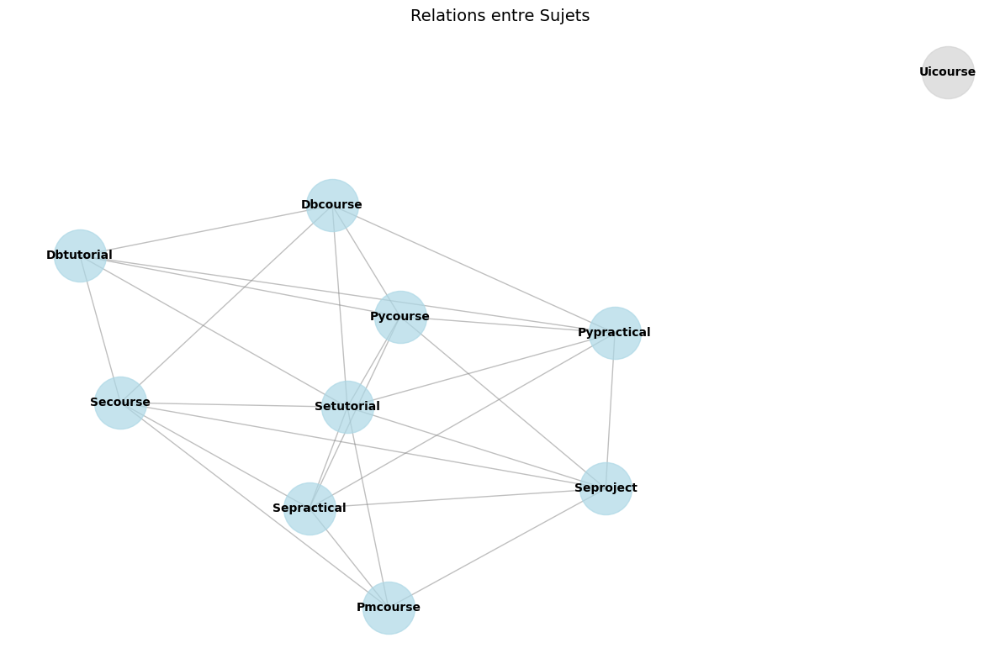

In [172]:
from rdflib import Graph, RDF, Namespace
import itertools
import re
import networkx as nx
import matplotlib.pyplot as plt

# Définition des namespaces
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")
tao_namespace = Namespace("http://sonfack.com/2023/12/tao/")
rdfs = Namespace("http://www.w3.org/2000/01/rdf-schema#")
rdf = Namespace("http://www.w3.org/1999/02/22-rdf-syntax-ns#")

def extract_name_without_identifiers(uri: str, namespace: str) -> str:
    """Extrait le nom sans identifiants de l'URI après le namespace."""
    match = re.match(f"{re.escape(namespace)}(.+?)(?:[-_].*)?$", uri)
    if match:
        return match.group(1).replace('-', ' ').replace('_', ' ').title()
    return uri

def get_all_activities(graph: Graph) -> dict:
    """Retourne un dictionnaire {URI: Nom} pour toutes les activités du graphe."""
    activities = {
        str(activity): extract_name_without_identifiers(str(activity), str(tao_namespace))
        for activity in graph.subjects(predicate=RDF.type, object=cao_namespace.Activity, unique=True)
    }
    return activities

def split_subjects_objects():
    """
    Compare les sujets et identifie ceux qui sont reliés.
    """
    # Chargement du graphe RDF
    akg_file = "/content/drive/MyDrive/teaching_akg.ttl"
    graph = Graph()
    graph.parse(akg_file, format="turtle")

    # Récupération des activités
    subjects = get_all_activities(graph)
    subject_pairs = list(itertools.combinations(subjects.keys(), 2))
    relations = set()
    connected_subjects = set()

    # Requête SPARQL simplifiée
    for subj1, subj2 in subject_pairs:
        query = f"""
        PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
        PREFIX cao: <http://sonfack.com/2023/12/cao/>

        ASK {{
            <{subj1}> ?p ?object .
            <{subj2}> ?p ?object .
            FILTER (?p != rdf:type)
        }}
        """

        if bool(graph.query(query)):
            relations.add((subjects[subj1], subjects[subj2]))
            connected_subjects.update([subjects[subj1], subjects[subj2]])

    # Identification des sujets isolés
    isolated = set(subjects.values()) - connected_subjects

    return relations, list(isolated)

def visualize_clean_subjects(relations, isolated_subjects):
    """
    Crée une visualisation épurée des relations entre sujets, sans information sur les arêtes.
    """
    G = nx.Graph()

    # Ajout des relations
    for subj1, subj2 in relations:
        G.add_edge(subj1, subj2)

    # Ajout des sujets isolés
    for subject in isolated_subjects:
        G.add_node(subject)

    # Configuration de la visualisation
    plt.figure(figsize=(12, 8))
    pos = nx.spring_layout(G, k=1.5, iterations=50)  # k augmenté pour plus d'espace

    # Dessin des nœuds connectés
    connected = list(set(n for e in G.edges for n in e))
    nx.draw_networkx_nodes(G, pos,
                          nodelist=connected,
                          node_color='lightblue',
                          node_size=2000,
                          alpha=0.7)

    # Dessin des nœuds isolés
    if isolated_subjects:
        nx.draw_networkx_nodes(G, pos,
                              nodelist=isolated_subjects,
                              node_color='lightgray',
                              node_size=2000,
                              alpha=0.7)

    # Dessin des arêtes simple
    nx.draw_networkx_edges(G, pos,
                          edge_color='gray',
                          width=1.0,
                          alpha=0.5)

    # Ajout des labels des nœuds
    nx.draw_networkx_labels(G, pos, font_size=10, font_weight='bold')

    plt.title("Relations entre Sujets", pad=20, fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    return plt

def main():
    # Obtention des relations et des sujets isolés
    relations, isolated = split_subjects_objects()

    # Affichage textuel des résultats
    print("\nSujets connectés :")
    for subj1, subj2 in relations:
        print(f"{subj1} ↔ {subj2}")

    if isolated:
        print("\nSujets isolés :")
        for subj in isolated:
            print(f"- {subj}")



    # Visualisation du graphe
    plt = visualize_clean_subjects(relations, isolated)
    plt.show()

if __name__ == "__main__":
    main()


Analyse des communautés détectées :

Communauté 1 (4 membres):
  - Dbcourse
  - Dbtutorial
  - Pycourse
  - Pypractical

Communauté 2 (1 membres):
  - Uicourse

Communauté 3 (5 membres):
  - Pmcourse
  - Secourse
  - Sepractical
  - Seproject
  - Setutorial


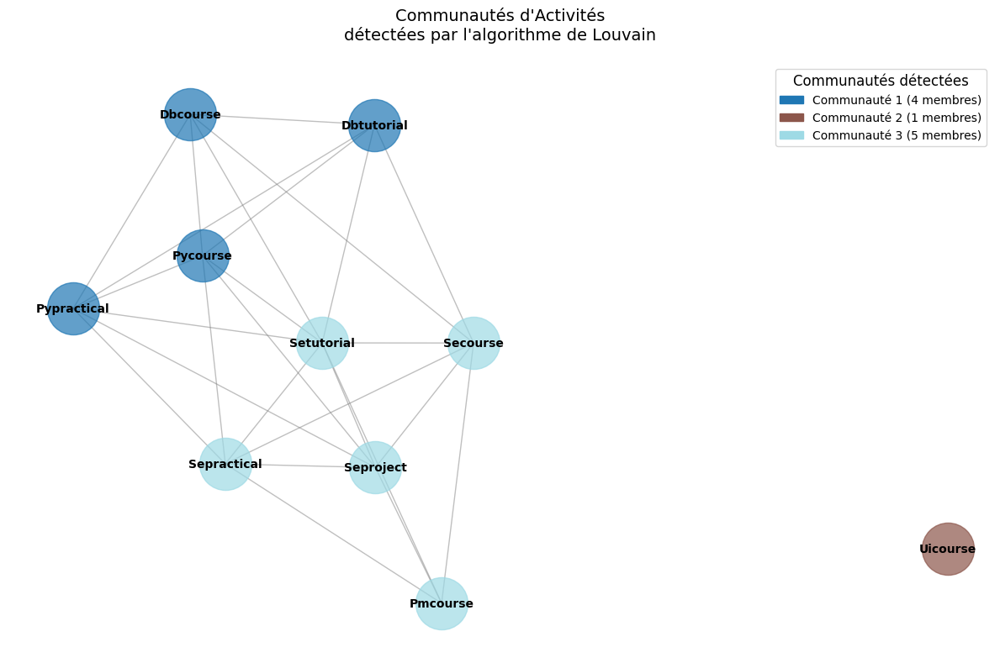

In [173]:
from rdflib import Graph, RDF, Namespace
import itertools
import re
import networkx as nx
import matplotlib.pyplot as plt
from networkx.algorithms.community import louvain_communities
import matplotlib.patches as mpatches
import numpy as np  # Ajout de l'import manquant

# Namespaces
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")
tao_namespace = Namespace("http://sonfack.com/2023/12/tao/")
rdfs = Namespace("http://www.w3.org/2000/01/rdf-schema#")
rdf = Namespace("http://www.w3.org/1999/02/22-rdf-syntax-ns#")

def extract_name_without_identifiers(uri: str, namespace: str) -> str:
    """Extrait le nom sans identifiants de l'URI après le namespace."""
    match = re.match(f"{re.escape(namespace)}(.+?)(?:[-_].*)?$", uri)
    if match:
        return match.group(1).replace('-', ' ').replace('_', ' ').title()
    return uri

def get_all_activities(graph: Graph) -> dict:
    """Retourne un dictionnaire {URI: Nom} pour toutes les activités du graphe."""
    activities = {
        str(activity): extract_name_without_identifiers(str(activity), str(tao_namespace))
        for activity in graph.subjects(predicate=RDF.type, object=cao_namespace.Activity, unique=True)
    }
    return activities

def get_shared_objects_count(graph: Graph, subj1: str, subj2: str) -> int:
    """Compte le nombre d'objets partagés entre deux sujets."""
    query = f"""
    PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
    PREFIX cao: <http://sonfack.com/2023/12/cao/>

    SELECT (COUNT(DISTINCT ?object) as ?count)
    WHERE {{
        <{subj1}> ?p ?object .
        <{subj2}> ?p ?object .
        FILTER (?p != rdf:type)
    }}
    """
    results = graph.query(query)
    return int(list(results)[0][0])

def create_weighted_graph():
    """Crée un graphe pondéré basé sur le nombre d'objets partagés."""
    # Chargement du graphe RDF
    akg_file = "/content/drive/MyDrive/teaching_akg.ttl"
    graph = Graph()
    graph.parse(akg_file, format="turtle")

    # Création du graphe NetworkX
    G = nx.Graph()
    subjects = get_all_activities(graph)
    subject_pairs = list(itertools.combinations(subjects.keys(), 2))

    # Ajout des nœuds
    for uri, name in subjects.items():
        G.add_node(name)

    # Ajout des arêtes pondérées
    for subj1, subj2 in subject_pairs:
        weight = get_shared_objects_count(graph, subj1, subj2)
        if weight > 0:
            G.add_edge(subjects[subj1], subjects[subj2], weight=weight)

    return G

def visualize_communities(G, communities):
    """Visualise le graphe avec les communautés détectées."""
    plt.figure(figsize=(12, 8))
    pos = nx.spring_layout(G, k=1.5, iterations=50)

    # Création d'une palette de couleurs pour les communautés
    n_communities = len(communities)
    colors = plt.cm.tab20(np.linspace(0, 1, n_communities))

    # Dessin des nœuds colorés par communauté
    legend_patches = []
    for idx, community in enumerate(communities):
        nx.draw_networkx_nodes(G, pos,
                             nodelist=list(community),
                             node_color=[colors[idx]],
                             node_size=2000,
                             alpha=0.7)
        # Ajout d'un patch pour la légende
        patch = mpatches.Patch(color=colors[idx],
                             label=f'Communauté {idx+1} ({len(community)} membres)')
        legend_patches.append(patch)

    # Dessin des arêtes
    nx.draw_networkx_edges(G, pos,
                          edge_color='gray',
                          width=1.0,
                          alpha=0.5)

    # Ajout des labels des nœuds
    nx.draw_networkx_labels(G, pos, font_size=10, font_weight='bold')

    # Ajout de la légende
    plt.legend(handles=legend_patches,
              loc='upper right',
              title="Communautés détectées",
              title_fontsize=12,
              fontsize=10)

    plt.title("Communautés d'Activités\ndétectées par l'algorithme de Louvain",
              pad=20, fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    return plt

def main():
    # Création du graphe pondéré
    G = create_weighted_graph()

    # Détection des communautés avec l'algorithme de Louvain
    communities = louvain_communities(G)

    # Affichage des statistiques sur les communautés
    print("\nAnalyse des communautés détectées :")
    for i, community in enumerate(communities, 1):
        print(f"\nCommunauté {i} ({len(community)} membres):")
        for node in sorted(community):  # Tri des noms pour une meilleure lisibilité
            print(f"  - {node}")

    # Visualisation du graphe avec les communautés
    plt = visualize_communities(G, communities)
    plt.show()

if __name__ == "__main__":
    main()


Analyse détaillée des communautés :

Communauté 1 (4 membres):

Membres :
  - Dbcourse
  - Dbtutorial
  - Pycourse
  - Pypractical

Densité des connexions : 1.000

Communauté 2 (1 membres):

Membres :
  - Uicourse

Densité des connexions : 0.000

Communauté 3 (5 membres):

Membres :
  - Pmcourse
  - Secourse
  - Sepractical
  - Seproject
  - Setutorial

Densité des connexions : 1.000


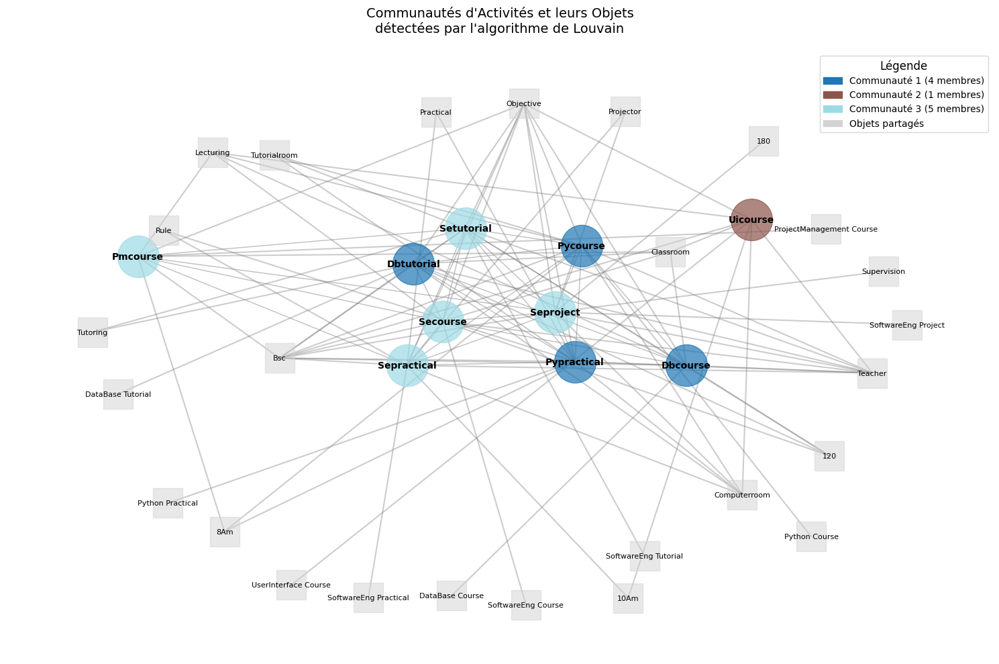

In [174]:
def get_activity_objects(graph: Graph, activity_uri: str) -> list:
    """
    Récupère tous les objets liés à une activité donnée.

    Args:
        graph: Le graphe RDF
        activity_uri: L'URI de l'activité

    Returns:
        Liste des objets (noms) liés à l'activité
    """
    query = f"""
    PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>

    SELECT DISTINCT ?object
    WHERE {{
        <{activity_uri}> ?predicate ?object .
        FILTER(?predicate != rdf:type)
    }}
    """
    results = graph.query(query)
    objects = []
    for row in results:
        obj_name = extract_name_without_identifiers(str(row[0]), str(tao_namespace))
        objects.append(obj_name)
    return objects

def visualize_communities_with_objects(G, communities, graph: Graph):
    """
    Visualise le graphe avec les communautés et leurs objets associés.

    Args:
        G: Le graphe NetworkX des activités
        communities: Les communautés détectées
        graph: Le graphe RDF original
    """
    plt.figure(figsize=(15, 10))

    # Création d'un nouveau graphe qui inclura les objets
    G_with_objects = nx.Graph()

    # Ajout des nœuds d'activités existants
    for node in G.nodes():
        G_with_objects.add_node(node, type='activity')

    # Ajout des arêtes entre activités
    for edge in G.edges(data=True):
        G_with_objects.add_edge(edge[0], edge[1], weight=edge[2]['weight'])

    # Récupération des objets pour chaque activité
    activity_uris = {
        name: uri for uri, name in get_all_activities(graph).items()
    }

    # Dictionnaire pour suivre les objets déjà ajoutés
    added_objects = set()

    # Ajout des objets et leurs connexions
    for activity_name, activity_uri in activity_uris.items():
        objects = get_activity_objects(graph, activity_uri)
        for obj in objects:
            if obj not in added_objects:
                G_with_objects.add_node(obj, type='object')
                added_objects.add(obj)
            G_with_objects.add_edge(activity_name, obj, type='activity-object')

    # Création du layout
    pos = nx.spring_layout(G_with_objects, k=2, iterations=50)

    # Couleurs pour les communautés
    n_communities = len(communities)
    community_colors = plt.cm.tab20(np.linspace(0, 1, n_communities))

    # Création d'un dictionnaire activité -> communauté
    activity_to_community = {}
    for idx, community in enumerate(communities):
        for activity in community:
            activity_to_community[activity] = idx

    # Dessin des nœuds d'activités par communauté
    legend_patches = []
    for idx, community in enumerate(communities):
        # Dessin des nœuds d'activités de la communauté
        nx.draw_networkx_nodes(G_with_objects, pos,
                             nodelist=list(community),
                             node_color=[community_colors[idx]],
                             node_size=2000,
                             alpha=0.7)
        patch = mpatches.Patch(color=community_colors[idx],
                             label=f'Communauté {idx+1} ({len(community)} membres)')
        legend_patches.append(patch)

    # Dessin des nœuds d'objets
    object_nodes = [node for node in G_with_objects.nodes() if node not in activity_to_community]
    nx.draw_networkx_nodes(G_with_objects, pos,
                          nodelist=object_nodes,
                          node_color='lightgray',
                          node_shape='s',  # Carrés pour les objets
                          node_size=1000,
                          alpha=0.5)

    # Dessin des arêtes
    # Arêtes entre activités
    activity_edges = [(u, v) for (u, v) in G_with_objects.edges()
                     if u in activity_to_community and v in activity_to_community]
    nx.draw_networkx_edges(G_with_objects, pos,
                          edgelist=activity_edges,
                          edge_color='gray',
                          width=1.0,
                          alpha=0.5)

    # Arêtes activité-objet
    object_edges = [(u, v) for (u, v) in G_with_objects.edges()
                   if (u in activity_to_community and v not in activity_to_community) or
                      (v in activity_to_community and u not in activity_to_community)]
    nx.draw_networkx_edges(G_with_objects, pos,
                          edgelist=object_edges,
                          edge_color='gray',  # Couleur plus foncée pour plus de visibilité
                          style='solid',      # Style solide au lieu de pointillé
                          width=1.5,          # Augmentation de l'épaisseur des arêtes
                          alpha=0.4)          # Augmentation de l'opacité

    # Ajout des labels
    # Labels des activités
    activity_labels = {node: node for node in G_with_objects.nodes()
                      if node in activity_to_community}
    nx.draw_networkx_labels(G_with_objects, pos,
                           labels=activity_labels,
                           font_size=10,
                           font_weight='bold')

    # Labels des objets
    object_labels = {node: node for node in object_nodes}
    nx.draw_networkx_labels(G_with_objects, pos,
                           labels=object_labels,
                           font_size=8)

    # Ajout d'un patch pour les objets dans la légende
    object_patch = mpatches.Patch(color='lightgray', label='Objets partagés')
    legend_patches.append(object_patch)

    # Ajout de la légende
    plt.legend(handles=legend_patches,
              loc='upper right',
              title="Légende",
              title_fontsize=12,
              fontsize=10)

    plt.title("Communautés d'Activités et leurs Objets\ndétectées par l'algorithme de Louvain",
              pad=20, fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    return plt

def main():
    # Chargement du graphe RDF
    akg_file = "/content/drive/MyDrive/teaching_akg.ttl"
    graph = Graph()
    graph.parse(akg_file, format="turtle")

    # Création du graphe pondéré
    G = create_weighted_graph()

    # Détection des communautés avec l'algorithme de Louvain
    communities = louvain_communities(G)

    # Analyse détaillée des communautés avec leurs objets
    analyze_communities_with_objects(graph, communities, G)

    # Visualisation enrichie du graphe avec les communautés et les objets
    plt = visualize_communities_with_objects(G, communities, graph)
    plt.show()

if __name__ == "__main__":
    main()

In [175]:
from rdflib import Graph
import networkx as nx
from collections import defaultdict

def get_all_objects_detailed(graph: Graph):
    """
    Récupère tous les objets du graphe RDF avec des informations détaillées.
    Cette fonction permet d'obtenir :
    1. La liste complète des objets
    2. Les activités associées à chaque objet
    3. Des statistiques sur l'utilisation des objets

    Args:
        graph: Le graphe RDF à analyser

    Returns:
        Un tuple contenant :
        - L'ensemble de tous les objets uniques
        - Un dictionnaire des objets avec leurs activités associées
        - Un dictionnaire des statistiques
    """
    # Requête SPARQL pour obtenir tous les objets et leurs prédicats
    query = """
    PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>

    SELECT DISTINCT ?subject ?predicate ?object
    WHERE {
        ?subject ?predicate ?object .
        FILTER(?predicate != rdf:type)
    }
    """

    results = graph.query(query)

    # Initialisation des structures de données
    all_objects = set()  # Ensemble pour stocker tous les objets uniques
    object_activities = defaultdict(set)  # Dictionnaire pour stocker les activités liées à chaque objet

    # Traitement des résultats
    for row in results:
        subject = extract_name_without_identifiers(str(row[0]), str(tao_namespace))
        obj = extract_name_without_identifiers(str(row[2]), str(tao_namespace))

        # Ajout de l'objet à l'ensemble des objets uniques
        all_objects.add(obj)

        # Association de l'objet avec son activité
        object_activities[obj].add(subject)

    # Calcul des statistiques
    statistics = {
        'total_objects': len(all_objects),
        'most_shared_objects': [],
        'object_usage': defaultdict(int)
    }

    # Calcul du nombre d'activités par objet
    for obj, activities in object_activities.items():
        statistics['object_usage'][obj] = len(activities)

    # Tri des objets par nombre d'activités
    sorted_objects = sorted(
        statistics['object_usage'].items(),
        key=lambda x: x[1],
        reverse=True
    )

    # Récupération des 10 objets les plus partagés
    statistics['most_shared_objects'] = sorted_objects[:10]

    return all_objects, object_activities, statistics

def display_object_analysis(graph: Graph):
    """
    Affiche une analyse détaillée de tous les objets du graphe.

    Args:
        graph: Le graphe RDF à analyser
    """
    # Récupération des données
    all_objects, object_activities, statistics = get_all_objects_detailed(graph)

    print("=== Analyse des Objets du Graphe RDF ===\n")

    # Affichage du nombre total d'objets
    print(f"Nombre total d'objets uniques : {statistics['total_objects']}")

    # Affichage des objets les plus partagés
    print("\nObjets les plus partagés :")
    for obj, count in statistics['most_shared_objects']:
        print(f"- {obj}: utilisé dans {count} activités")
        # Affichage des activités associées
        activities = object_activities[obj]
        print(f"  Activités associées : {', '.join(sorted(activities))}")

    # Calcul et affichage de statistiques supplémentaires
    usage_counts = statistics['object_usage'].values()
    avg_usage = sum(usage_counts) / len(usage_counts)
    print(f"\nUtilisation moyenne des objets : {avg_usage:.2f} activités par objet")

    # Affichage de la distribution des objets
    single_use = sum(1 for count in usage_counts if count == 1)
    print(f"Objets utilisés dans une seule activité : {single_use}")
    multi_use = sum(1 for count in usage_counts if count > 1)
    print(f"Objets partagés entre plusieurs activités : {multi_use}")

def main():
    # Chargement du graphe RDF
    graph = Graph()
    graph.parse("/content/drive/MyDrive/teaching_akg.ttl", format="turtle")

    # Analyse et affichage des objets
    display_object_analysis(graph)

if __name__ == "__main__":
    main()

=== Analyse des Objets du Graphe RDF ===

Nombre total d'objets uniques : 209

Objets les plus partagés :
- Teacher: utilisé dans 10 activités
  Activités associées : Dbcourse, Dbtutorial, Lecturing, Pycourse, Pypractical, Secourse, Sepractical, Seproject, Setutorial, Uicourse
- Bsc: utilisé dans 10 activités
  Activités associées : Dbcourse, Dbtutorial, Pmcourse, Pycourse, Pypractical, Secourse, Sepractical, Seproject, Setutorial, Uicourse
- http://sonfack.com/2023/12/cao/Activity: utilisé dans 10 activités
  Activités associées : Achieves, Hasconstraint, Haslocation, Iscarriedoutby, Iscomposedof, Isfollowedby, Issubjectof, Isusedfor, http://sonfack.com/2023/12/cao/Action, http://sonfack.com/2023/12/cao/Operation
- Objective: utilisé dans 10 activités
  Activités associées : Dbcourse, Dbtutorial, Pmcourse, Pycourse, Pypractical, Secourse, Sepractical, Seproject, Setutorial, Uicourse
- http://sonfack.com/2023/12/cao/Subject: utilisé dans 6 activités
  Activités associées : Achieves, Ha

In [176]:
!pip install rdflib networkx python-louvain matplotlib numpy

Nombre total de nœuds : 162
Nombre total d'arêtes : 335

Répartition des types de nœuds :
  - Objet : 152
  - Activité : 10

Types de relations :
  - http://www.w3.org/1999/02/22-rdf-syntax-ns#type : 143
  - http://www.w3.org/2000/01/rdf-schema#subClassOf : 35
  - http://sonfack.com/2023/12/tao/isUsedFor : 22
  - http://sonfack.com/2023/12/tao/hasLocation : 14
  - http://sonfack.com/2023/12/tao/hasRole : 12
  - http://www.w3.org/2000/01/rdf-schema#range : 11
  - http://sonfack.com/2023/12/tao/isComposedOf : 10
  - http://sonfack.com/2023/12/tao/isBeneficialTo : 10
  - http://www.w3.org/2000/01/rdf-schema#domain : 10
  - Carriesout : 10
  - http://sonfack.com/2023/12/tao/hasSubject : 9
  - http://sonfack.com/2023/12/tao/hasObjective : 9
  - http://sonfack.com/2023/12/tao/isCarriedOutBy : 5
  - Hastime : 5
  - Hasbeginning : 5
  - Hasend : 5
  - http://sonfack.com/2023/12/tao/isFollowedBy : 5
  - http://www.w3.org/2002/07/owl#inverseOf : 3
  - http://purl.org/dc/terms/creator : 2
  - htt

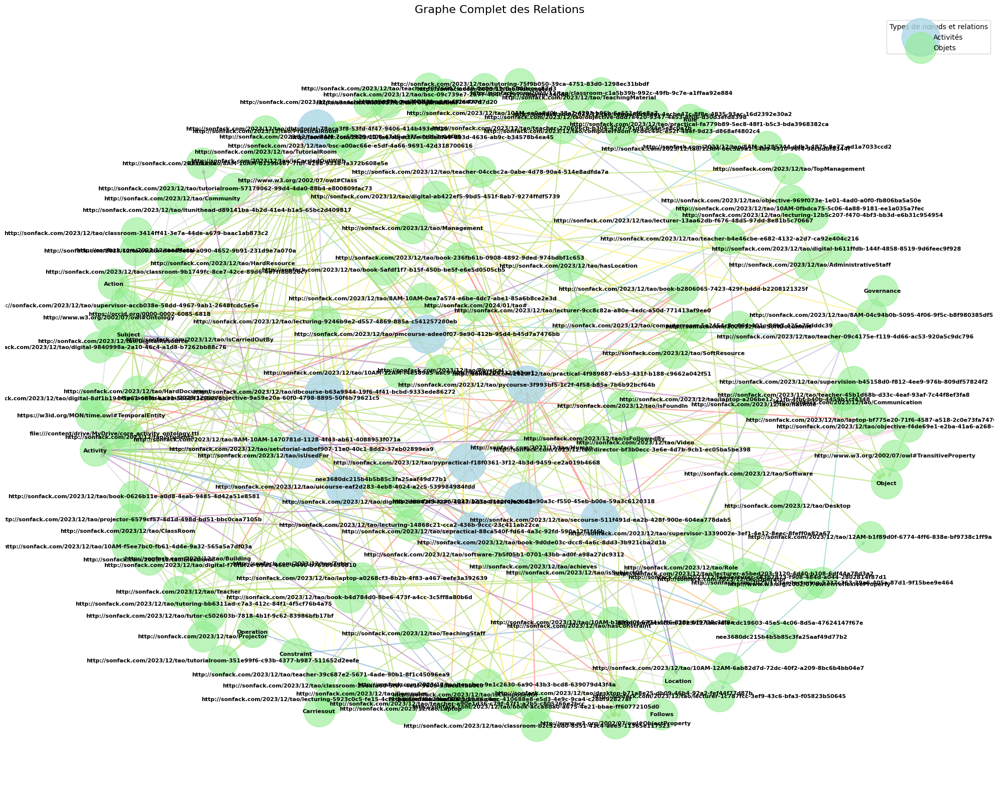

In [177]:
from rdflib import Graph, RDF, Namespace, URIRef, Literal
import itertools
import re
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

# Namespaces
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")
tao_namespace = Namespace("http://sonfack.com/2023/12/tao/")
rdfs = Namespace("http://www.w3.org/2000/01/rdf-schema#")
rdf = Namespace("http://www.w3.org/1999/02/22-rdf-syntax-ns#")

def extract_name_without_identifiers(uri: str, namespace: str) -> str:
    """Extrait le nom sans identifiants de l'URI après le namespace."""
    match = re.match(f"{re.escape(namespace)}(.+?)(?:[-_].*)?$", uri)
    if match:
        return match.group(1).replace('-', ' ').replace('_', ' ').title()
    return uri

def is_interesting_node(item):
    """Détermine si un nœud est intéressant à visualiser."""
    # Exclure les littéraux et certains types de nœuds peu informatifs
    if isinstance(item, Literal):
        return False

    # Convertir en string pour les comparaisons
    item_str = str(item)

    # Liste des namespaces à exclure
    exclude_namespaces = [
        "http://www.w3.org/1999/02/22-rdf-syntax-ns#",
        "http://www.w3.org/2000/01/rdf-schema#"
    ]

    # Vérifier si l'item n'est pas dans les namespaces à exclure
    return not any(ns in item_str for ns in exclude_namespaces)

def create_comprehensive_graph():
    """Crée un graphe NetworkX complet avec les relations entre objets."""
    # Chargement du graphe RDF
    akg_file = "/content/drive/MyDrive/teaching_akg.ttl"
    graph = Graph()
    graph.parse(akg_file, format="turtle")

    # Création du graphe NetworkX
    G = nx.MultiDiGraph()  # Utilisation d'un graphe multi-directionnel pour capturer les relations

    # Dictionnaire pour stocker les noms des nœuds
    node_names = {}

    # Passage 1 : Collecte de tous les nœuds intéressants
    all_interesting_nodes = set()
    for s, p, o in graph:
        if is_interesting_node(s):
            all_interesting_nodes.add(s)
        if is_interesting_node(o):
            all_interesting_nodes.add(o)

    # Passage 2 : Nommage des nœuds
    for node in all_interesting_nodes:
        node_str = str(node)

        # Essayer de trouver un nom lisible
        name = extract_name_without_identifiers(node_str, str(cao_namespace)) or \
               extract_name_without_identifiers(node_str, str(tao_namespace)) or \
               node_str.split('/')[-1]

        # Ajouter des informations de type si possible
        node_type = "Objet"
        if (node, RDF.type, cao_namespace.Activity) in graph:
            node_type = "Activité"

        # Ajouter le nœud au graphe
        G.add_node(name, type=node_type, uri=node_str)
        node_names[node_str] = name

    # Passage 3 : Ajout des relations
    for s, p, o in graph:
        if is_interesting_node(s) and is_interesting_node(o):
            # Convertir en noms lisibles
            subj_name = node_names.get(str(s))
            obj_name = node_names.get(str(o))

            # N'ajouter l'arête que si on a des noms pour les deux
            if subj_name and obj_name and subj_name != obj_name:
                # Essayer d'extraire un libellé de prédicat
                pred_name = extract_name_without_identifiers(str(p), str(cao_namespace)) or \
                            extract_name_without_identifiers(str(p), str(tao_namespace)) or \
                            str(p).split('/')[-1]

                G.add_edge(subj_name, obj_name, relation=pred_name)

    return G

def visualize_comprehensive_graph(G):
    """Visualise le graphe complet avec différents types de nœuds et relations."""
    plt.figure(figsize=(20, 16))

    # Layout avec plus d'espace
    pos = nx.spring_layout(G, k=0.9, iterations=50)

    # Séparer les types de nœuds
    activities = [node for node, data in G.nodes(data=True) if data.get('type') == 'Activité']
    objects = [node for node, data in G.nodes(data=True) if data.get('type') == 'Objet']

    # Dessiner les nœuds
    nx.draw_networkx_nodes(G, pos,
                           nodelist=activities,
                           node_color='lightblue',
                           node_size=3000,
                           alpha=0.8,
                           label='Activités')

    nx.draw_networkx_nodes(G, pos,
                           nodelist=objects,
                           node_color='lightgreen',
                           node_size=2000,
                           alpha=0.6,
                           label='Objets')

    # Dessiner les arêtes avec des couleurs différentes
    edges = list(G.edges(data=True))
    unique_relations = set(edge[2].get('relation', 'Unknown') for edge in edges)
    relation_colors = plt.cm.Set3(np.linspace(0, 1, len(unique_relations)))
    relation_color_map = dict(zip(unique_relations, relation_colors))

    # Créer des edges colorées par relation
    for relation in unique_relations:
        # Filtrer les edges pour cette relation
        relation_edges = [(u, v) for (u, v, d) in edges if d.get('relation') == relation]
        nx.draw_networkx_edges(G, pos,
                               edgelist=relation_edges,
                               edge_color=relation_color_map[relation],
                               width=1.5,
                               alpha=0.7,
                               arrows=True,
                               label=relation)

    # Ajouter les labels des nœuds
    nx.draw_networkx_labels(G, pos, font_size=8, font_weight='bold')

    # Ajouter une légende
    plt.legend(loc='best', title='Types de nœuds et relations')

    plt.title("Graphe Complet des Relations", fontsize=16)
    plt.axis('off')
    plt.tight_layout()

    return plt

def main():
    # Création du graphe complet
    G = create_comprehensive_graph()

    # Quelques statistiques de base
    print(f"Nombre total de nœuds : {G.number_of_nodes()}")
    print(f"Nombre total d'arêtes : {G.number_of_edges()}")

    # Types de nœuds
    node_types = {}
    for _, data in G.nodes(data=True):
        node_type = data.get('type', 'unknown')
        node_types[node_type] = node_types.get(node_type, 0) + 1

    print("\nRépartition des types de nœuds :")
    for type_name, count in node_types.items():
        print(f"  - {type_name} : {count}")

    # Analyse des relations
    relation_types = {}
    for _, _, data in G.edges(data=True):
        relation = data.get('relation', 'Unknown')
        relation_types[relation] = relation_types.get(relation, 0) + 1

    print("\nTypes de relations :")
    for relation, count in sorted(relation_types.items(), key=lambda x: x[1], reverse=True):
        print(f"  - {relation} : {count}")

    # Visualisation du graphe
    plt = visualize_comprehensive_graph(G)
    plt.show()

if __name__ == "__main__":
    main()


Analyse des communautés détectées :

Communauté 1 (4 membres) :
 - Dbcourse
 - Dbtutorial
 - Pycourse
 - Pypractical

Communauté 2 (5 membres) :
 - Pmcourse
 - Secourse
 - Sepractical
 - Seproject
 - Setutorial

Communauté 3 (1 membres) :
 - Uicourse


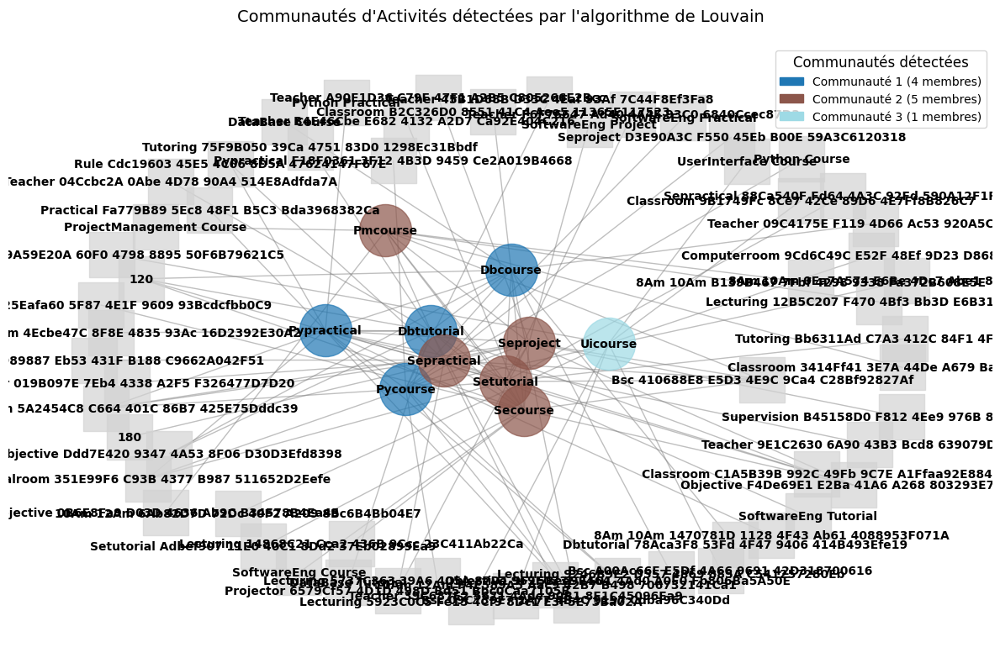

In [178]:
from rdflib import Graph, RDF, Namespace, URIRef
import itertools
import re
import networkx as nx
import matplotlib.pyplot as plt
from networkx.algorithms.community import louvain_communities
import matplotlib.patches as mpatches
import numpy as np

# Définition des espaces de noms
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")
tao_namespace = Namespace("http://sonfack.com/2023/12/tao/")
rdfs = Namespace("http://www.w3.org/2000/01/rdf-schema#")
rdf = Namespace("http://www.w3.org/1999/02/22/rdf-syntax-ns#")

def extract_name_without_identifiers(uri: str, namespace: str) -> str:
    """Extrait le nom sans identifiants de l'URI après le namespace."""
    match = re.match(f"{re.escape(namespace)}(.+?)(?:[-_].*)?$", uri)
    if match:
        return match.group(1).replace('-', ' ').replace('_', ' ').title()
    return uri

def get_all_activities(graph: Graph) -> dict:
    """
    Retourne un dictionnaire {URI: Nom} pour toutes les activités du graphe.
    On part du principe que les activités sont des sujets de type cao:Activity.
    """
    activities = {
        str(activity): extract_name_without_identifiers(str(activity), str(tao_namespace))
        for activity in graph.subjects(predicate=RDF.type, object=cao_namespace.Activity)
    }
    return activities

def get_shared_objects_count(graph: Graph, subj1: str, subj2: str) -> int:
    """
    Compte le nombre d'objets partagés entre deux sujets.
    On exclut la relation rdf:type.
    """
    query = f"""
    PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
    PREFIX cao: <http://sonfack.com/2023/12/cao/>
    SELECT (COUNT(DISTINCT ?object) as ?count)
    WHERE {{
        <{subj1}> ?p ?object .
        <{subj2}> ?p ?object .
        FILTER (?p != rdf:type)
    }}
    """
    results = graph.query(query)
    return int(list(results)[0][0])

def get_object_label(o) -> str:
    """
    Extrait une étiquette lisible pour un objet RDF.
    Si l'objet est une URI, on en récupère la dernière partie.
    Sinon, on retourne sa représentation en chaîne.
    """
    if isinstance(o, URIRef):
        uri_str = str(o)
        if '#' in uri_str:
            label = uri_str.split('#')[-1]
        else:
            label = uri_str.split('/')[-1]
        return label.replace('-', ' ').replace('_', ' ').title()
    else:
        return str(o)

def get_objects_for_subject(graph: Graph, subj: str) -> set:
    """
    Retourne l'ensemble des étiquettes d'objets associés à un sujet donné.
    On exclut la propriété rdf:type.
    """
    objects_set = set()
    for s, p, o in graph.triples((URIRef(subj), None, None)):
        if p == RDF.type:
            continue
        label = get_object_label(o)
        objects_set.add(label)
    return objects_set

def create_weighted_graph() -> nx.Graph:
    """
    Crée un graphe pondéré basé sur le nombre d'objets partagés entre activités
    et ajoute également les relations entre chaque activité (sujet) et ses objets.
    """
    # Chargement du graphe RDF
    akg_file = "/content/drive/MyDrive/teaching_akg.ttl"
    rdf_graph = Graph()
    rdf_graph.parse(akg_file, format="turtle")

    # Création du graphe NetworkX
    G = nx.Graph()

    # Récupération des activités (sujets)
    activities = get_all_activities(rdf_graph)

    # Ajout des nœuds pour les sujets avec un attribut "type" pour distinguer les nœuds
    for subj_uri, subj_name in activities.items():
        G.add_node(subj_name, type="subject", uri=subj_uri)

    # Ajout des arêtes pondérées entre sujets selon leurs objets partagés
    subject_pairs = list(itertools.combinations(activities.keys(), 2))
    for subj1, subj2 in subject_pairs:
        weight = get_shared_objects_count(rdf_graph, subj1, subj2)
        if weight > 0:
            G.add_edge(activities[subj1], activities[subj2], weight=weight)

    # Pour chaque sujet, on ajoute les objets associés et la relation sujet-objet
    for subj_uri, subj_name in activities.items():
        objects = get_objects_for_subject(rdf_graph, subj_uri)
        for obj_label in objects:
            if not G.has_node(obj_label):
                G.add_node(obj_label, type="object")
            # L'arête entre le sujet et l'objet est ajoutée (poids fixé à 1, ajustable si nécessaire)
            G.add_edge(subj_name, obj_label, weight=1)

    return G

def visualize_communities(G: nx.Graph, communities) -> plt.Figure:
    """
    Visualise le graphe complet en affichant :
      - Les nœuds sujets colorés selon leur communauté (détectée par Louvain)
      - Les nœuds objets avec une forme différente et une couleur uniforme
      - Les arêtes reliant sujets-sujets et sujets-objets
    """
    plt.figure(figsize=(12, 8))
    pos = nx.spring_layout(G, k=1.5, iterations=50, seed=42)

    # Séparer les nœuds sujets et objets selon leur attribut "type"
    subject_nodes = [n for n, d in G.nodes(data=True) if d.get("type") == "subject"]
    object_nodes = [n for n, d in G.nodes(data=True) if d.get("type") == "object"]

    # Création d'une palette de couleurs pour les communautés
    n_communities = len(communities)
    colors = plt.cm.tab20(np.linspace(0, 1, n_communities))

    legend_patches = []
    # Dessin des nœuds sujets par communauté
    for idx, community in enumerate(communities):
        nodes_in_comm = list(community)  # Les noms des sujets dans cette communauté
        nx.draw_networkx_nodes(G, pos, nodelist=nodes_in_comm,
                               node_color=[colors[idx]], node_size=2000, alpha=0.7)
        patch = mpatches.Patch(color=colors[idx], label=f'Communauté {idx+1} ({len(community)} membres)')
        legend_patches.append(patch)

    # Dessin des nœuds objets (affichés en carré et en gris clair)
    nx.draw_networkx_nodes(G, pos, nodelist=object_nodes,
                           node_color='lightgray', node_shape='s', node_size=1500, alpha=0.7)

    # Dessin des arêtes (pour tous les types de relation)
    nx.draw_networkx_edges(G, pos, edge_color='gray', width=1.0, alpha=0.5)

    # Ajout des étiquettes pour tous les nœuds
    nx.draw_networkx_labels(G, pos, font_size=10, font_weight='bold')

    # Affichage de la légende et du titre
    plt.legend(handles=legend_patches, loc='upper right',
               title="Communautés détectées", title_fontsize=12, fontsize=10)
    plt.title("Communautés d'Activités détectées par l'algorithme de Louvain",
              pad=20, fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    return plt

def main():
    # Création du graphe pondéré incluant à la fois les relations entre sujets
    # et les relations sujet-objet.
    G = create_weighted_graph()

    # Pour la détection des communautés, on ne considère que les nœuds sujets
    subject_nodes = [n for n, d in G.nodes(data=True) if d.get("type") == "subject"]
    G_subject = G.subgraph(subject_nodes).copy()

    communities = louvain_communities(G_subject)

    # Affichage des statistiques sur les communautés détectées
    print("\nAnalyse des communautés détectées :")
    for i, community in enumerate(communities, 1):
        print(f"\nCommunauté {i} ({len(community)} membres) :")
        for node in sorted(community):
            print(f" - {node}")

    # Visualisation du graphe complet avec les communautés et les relations sujet-objet
    plt_fig = visualize_communities(G, communities)
    plt_fig.show()

if __name__ == "__main__":
    main()



Analyse des communautés détectées :

Communauté 1 (4 membres) :
 - Dbcourse
 - Dbtutorial
 - Pycourse
 - Pypractical

Communauté 2 (5 membres) :
 - Pmcourse
 - Secourse
 - Sepractical
 - Seproject
 - Setutorial

Communauté 3 (1 membres) :
 - Uicourse


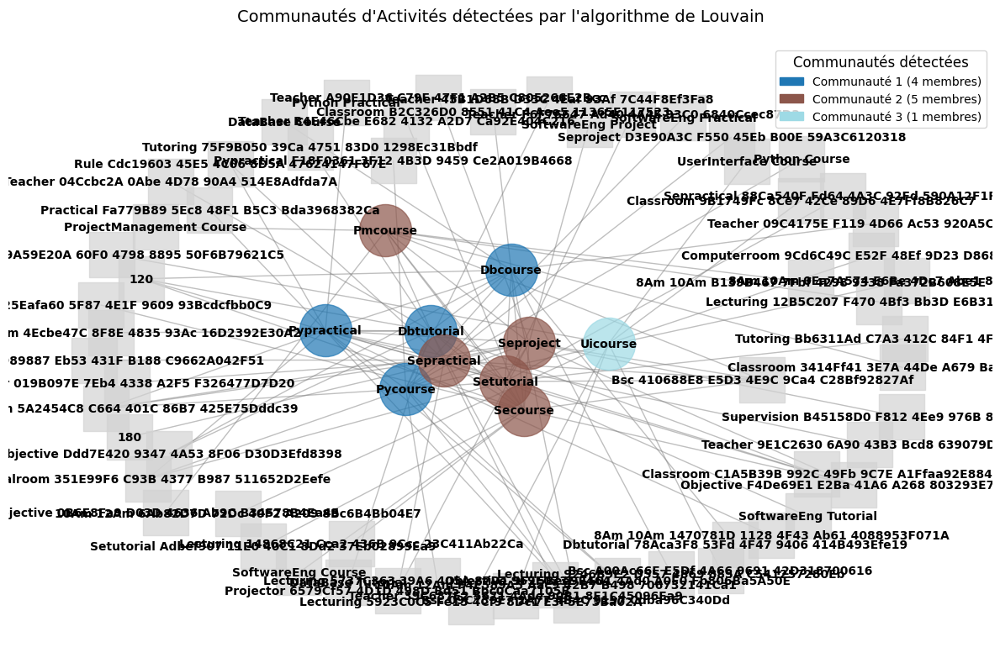

In [179]:
from rdflib import Graph, RDF, Namespace, URIRef
import itertools
import re
import networkx as nx
import matplotlib.pyplot as plt
from networkx.algorithms.community import louvain_communities
import matplotlib.patches as mpatches
import numpy as np

# Définition des espaces de noms
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")
tao_namespace = Namespace("http://sonfack.com/2023/12/tao/")
rdfs = Namespace("http://www.w3.org/2000/01/rdf-schema#")
rdf = Namespace("http://www.w3.org/1999/02/22-rdf-syntax-ns#")

def extract_name_without_identifiers(uri: str, namespace: str) -> str:
    """Extrait le nom sans identifiants de l'URI après le namespace."""
    match = re.match(f"{re.escape(namespace)}(.+?)(?:[-_].*)?$", uri)
    if match:
        return match.group(1).replace('-', ' ').replace('_', ' ').title()
    return uri

def get_all_activities(graph: Graph) -> dict:
    """
    Retourne un dictionnaire {URI: Nom} pour toutes les activités du graphe.
    On part du principe que les activités sont des sujets de type cao:Activity.
    """
    activities = {
        str(activity): extract_name_without_identifiers(str(activity), str(tao_namespace))
        for activity in graph.subjects(predicate=RDF.type, object=cao_namespace.Activity)
    }
    return activities

def get_shared_objects_count(graph: Graph, subj1: str, subj2: str) -> int:
    """
    Compte le nombre d'objets partagés entre deux sujets.
    On exclut la relation rdf:type.
    """
    query = f"""
    PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
    PREFIX cao: <http://sonfack.com/2023/12/cao/>
    SELECT (COUNT(DISTINCT ?object) as ?count)
    WHERE {{
        <{subj1}> ?p ?object .
        <{subj2}> ?p ?object .
        FILTER (?p != rdf:type)
    }}
    """
    results = graph.query(query)
    return int(list(results)[0][0])

def get_object_label(o) -> str:
    """
    Extrait une étiquette lisible pour un objet RDF.
    Si l'objet est une URI, on en récupère la dernière partie.
    Sinon, on retourne sa représentation en chaîne.
    """
    if isinstance(o, URIRef):
        uri_str = str(o)
        if '#' in uri_str:
            label = uri_str.split('#')[-1]
        else:
            label = uri_str.split('/')[-1]
        return label.replace('-', ' ').replace('_', ' ').title()
    else:
        return str(o)

def get_objects_for_subject(graph: Graph, subj: str) -> set:
    """
    Retourne l'ensemble des étiquettes d'objets associés à un sujet donné.
    On exclut la propriété rdf:type.
    """
    objects_set = set()
    for s, p, o in graph.triples((URIRef(subj), None, None)):
        if p == RDF.type:
            continue
        label = get_object_label(o)
        objects_set.add(label)
    return objects_set

def create_weighted_graph() -> nx.Graph:
    """
    Crée un graphe pondéré basé sur le nombre d'objets partagés entre activités
    et ajoute également les relations entre chaque activité (sujet) et ses objets.
    """
    # Chargement du graphe RDF
    akg_file = "/content/drive/MyDrive/teaching_akg.ttl"
    rdf_graph = Graph()
    rdf_graph.parse(akg_file, format="turtle")

    # Création du graphe NetworkX
    G = nx.Graph()

    # Récupération des activités (sujets)
    activities = get_all_activities(rdf_graph)

    # Ajout des nœuds pour les sujets avec un attribut "type" pour distinguer les nœuds
    for subj_uri, subj_name in activities.items():
        G.add_node(subj_name, type="subject", uri=subj_uri)

    # Ajout des arêtes pondérées entre sujets selon leurs objets partagés
    subject_pairs = list(itertools.combinations(activities.keys(), 2))
    for subj1, subj2 in subject_pairs:
        weight = get_shared_objects_count(rdf_graph, subj1, subj2)
        if weight > 0:
            G.add_edge(activities[subj1], activities[subj2], weight=weight)

    # Pour chaque sujet, on ajoute les objets associés et la relation sujet-objet
    for subj_uri, subj_name in activities.items():
        objects = get_objects_for_subject(rdf_graph, subj_uri)
        for obj_label in objects:
            if not G.has_node(obj_label):
                G.add_node(obj_label, type="object")
            # L'arête entre le sujet et l'objet est ajoutée (poids fixé à 1, ajustable si nécessaire)
            G.add_edge(subj_name, obj_label, weight=1)

    return G

def visualize_communities(G: nx.Graph, communities) -> plt.Figure:
    """
    Visualise le graphe complet en affichant :
      - Les nœuds sujets colorés selon leur communauté (détectée par Louvain)
      - Les nœuds objets avec une forme différente et une couleur uniforme
      - Les arêtes reliant sujets-sujets et sujets-objets
    """
    plt.figure(figsize=(12, 8))
    pos = nx.spring_layout(G, k=1.5, iterations=50, seed=42)

    # Séparer les nœuds sujets et objets selon leur attribut "type"
    subject_nodes = [n for n, d in G.nodes(data=True) if d.get("type") == "subject"]
    object_nodes = [n for n, d in G.nodes(data=True) if d.get("type") == "object"]

    # Création d'une palette de couleurs pour les communautés
    n_communities = len(communities)
    colors = plt.cm.tab20(np.linspace(0, 1, n_communities))

    legend_patches = []
    # Dessin des nœuds sujets par communauté
    for idx, community in enumerate(communities):
        nodes_in_comm = list(community)  # Les noms des sujets dans cette communauté
        nx.draw_networkx_nodes(G, pos, nodelist=nodes_in_comm,
                               node_color=[colors[idx]], node_size=2000, alpha=0.7)
        patch = mpatches.Patch(color=colors[idx], label=f'Communauté {idx+1} ({len(community)} membres)')
        legend_patches.append(patch)

    # Dessin des nœuds objets (affichés en carré et en gris clair)
    nx.draw_networkx_nodes(G, pos, nodelist=object_nodes,
                           node_color='lightgray', node_shape='s', node_size=1500, alpha=0.7)

    # Dessin des arêtes (pour tous les types de relation)
    nx.draw_networkx_edges(G, pos, edge_color='gray', width=1.0, alpha=0.5)

    # Ajout des étiquettes pour tous les nœuds
    nx.draw_networkx_labels(G, pos, font_size=10, font_weight='bold')

    # Affichage de la légende et du titre
    plt.legend(handles=legend_patches, loc='upper right',
               title="Communautés détectées", title_fontsize=12, fontsize=10)
    plt.title("Communautés d'Activités détectées par l'algorithme de Louvain",
              pad=20, fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    return plt

#############################################
# Création du graphe des communautés
#############################################
def create_communities_graph(G: nx.Graph, communities) -> nx.Graph:
    """
    Crée un graphe des communautés.
    Chaque nœud représente une communauté (ex: "Communauté 1").
    On relie deux communautés si elles partagent au moins un objet (issus des relations sujet-objet).
    Le poids de l'arête correspond au nombre d'objets communs.
    """
    G_comm = nx.Graph()

    # Dictionnaire pour stocker l'ensemble des objets associés à chaque communauté.
    comm_objects = {}

    for idx, community in enumerate(communities, 1):
        comm_label = f"Communauté {idx}"
        comm_objects[comm_label] = set()
        # Pour chaque sujet de la communauté, on collecte ses voisins de type "object"
        for subject in community:
            for neighbor in G.neighbors(subject):
                if G.nodes[neighbor].get("type") == "object":
                    comm_objects[comm_label].add(neighbor)
        # Ajout du nœud communauté avec un attribut (pour information)
        G_comm.add_node(comm_label, objects=comm_objects[comm_label])

    # Ajout des arêtes entre communautés si elles partagent des objets
    comm_labels = list(comm_objects.keys())
    for i in range(len(comm_labels)):
        for j in range(i+1, len(comm_labels)):
            c1 = comm_labels[i]
            c2 = comm_labels[j]
            common_objs = comm_objects[c1].intersection(comm_objects[c2])
            if common_objs:
                # L'arête a pour poids le nombre d'objets partagés
                G_comm.add_edge(c1, c2, weight=len(common_objs), common_objects=common_objs)
    return G_comm

def visualize_communities_graph(G_comm: nx.Graph):
    """
    Visualise le graphe des communautés.
    Les nœuds représentent les communautés et les arêtes indiquent le nombre d'objets partagés.
    """
    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(G_comm, seed=42)

    # Dessin des nœuds
    nx.draw_networkx_nodes(G_comm, pos, node_color='skyblue', node_size=2000)
    # Dessin des arêtes
    nx.draw_networkx_edges(G_comm, pos, edge_color='gray', width=2)
    # Affichage des étiquettes des communautés
    nx.draw_networkx_labels(G_comm, pos, font_size=12, font_weight='bold')

    # Affichage des poids sur les arêtes (nombre d'objets partagés)
    edge_labels = nx.get_edge_attributes(G_comm, 'weight')
    nx.draw_networkx_edge_labels(G_comm, pos, edge_labels=edge_labels, font_color='red')

    plt.title("Graphe des communautés basées sur les objets partagés", fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

#############################################
# Fonction principale
#############################################
def main():
    # Création du graphe pondéré incluant les relations sujet-sujet et sujet-objet
    G = create_weighted_graph()

    # Pour la détection des communautés, on considère uniquement les nœuds sujets
    subject_nodes = [n for n, d in G.nodes(data=True) if d.get("type") == "subject"]
    G_subject = G.subgraph(subject_nodes).copy()

    communities = louvain_communities(G_subject)

    # Affichage des statistiques sur les communautés détectées
    print("\nAnalyse des communautés détectées :")
    for i, community in enumerate(communities, 1):
        print(f"\nCommunauté {i} ({len(community)} membres) :")
        for node in sorted(community):
            print(f" - {node}")

    # Visualisation du graphe complet avec les communautés et les relations sujet-objet
    plt_fig = visualize_communities(G, communities)
    plt_fig.show()

if __name__ == "__main__":
    main()




Analyse des communautés détectées :

Communauté 1 (4 membres) :
 - Dbcourse
 - Dbtutorial
 - Pycourse
 - Pypractical

Communauté 2 (5 membres) :
 - Pmcourse
 - Secourse
 - Sepractical
 - Seproject
 - Setutorial

Communauté 3 (1 membres) :
 - Uicourse


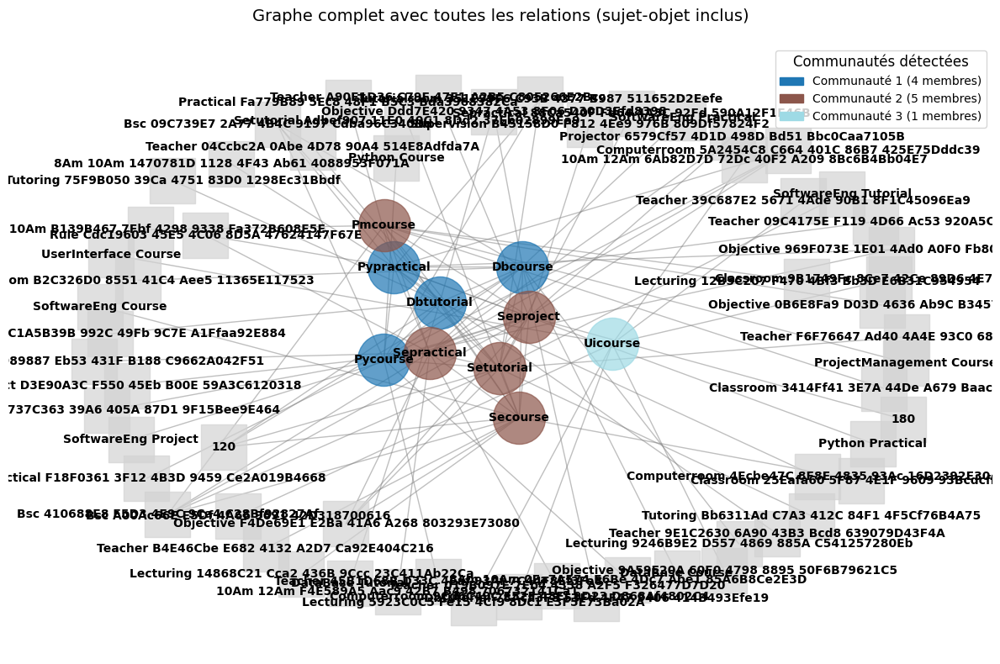

In [180]:
from rdflib import Graph, RDF, Namespace, URIRef
import itertools
import re
import networkx as nx
import matplotlib.pyplot as plt
from networkx.algorithms.community import louvain_communities
import matplotlib.patches as mpatches
import numpy as np

# Définition des espaces de noms
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")
tao_namespace = Namespace("http://sonfack.com/2023/12/tao/")
rdfs = Namespace("http://www.w3.org/2000/01/rdf-schema#")
rdf = Namespace("http://www.w3.org/1999/02/22-rdf-syntax-ns#")

def extract_name_without_identifiers(uri: str, namespace: str) -> str:
    """Extrait le nom sans identifiants de l'URI après le namespace."""
    match = re.match(f"{re.escape(namespace)}(.+?)(?:[-_].*)?$", uri)
    if match:
        return match.group(1).replace('-', ' ').replace('_', ' ').title()
    return uri

def get_all_activities(graph: Graph) -> dict:
    """
    Retourne un dictionnaire {URI: Nom} pour toutes les activités du graphe.
    On part du principe que les activités sont des sujets de type cao:Activity.
    """
    activities = {
        str(activity): extract_name_without_identifiers(str(activity), str(tao_namespace))
        for activity in graph.subjects(predicate=RDF.type, object=cao_namespace.Activity)
    }
    return activities

def get_shared_objects_count(graph: Graph, subj1: str, subj2: str) -> int:
    """
    Compte le nombre d'objets partagés entre deux sujets.
    On exclut la relation rdf:type.
    """
    query = f"""
    PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
    PREFIX cao: <http://sonfack.com/2023/12/cao/>
    SELECT (COUNT(DISTINCT ?object) as ?count)
    WHERE {{
        <{subj1}> ?p ?object .
        <{subj2}> ?p ?object .
        FILTER (?p != rdf:type)
    }}
    """
    results = graph.query(query)
    return int(list(results)[0][0])

def get_object_label(o) -> str:
    """
    Extrait une étiquette lisible pour un objet (ou prédicat) RDF.
    Si c'est une URI, on en récupère la dernière partie.
    Sinon, on retourne sa représentation en chaîne.
    """
    if isinstance(o, URIRef):
        uri_str = str(o)
        if '#' in uri_str:
            label = uri_str.split('#')[-1]
        else:
            label = uri_str.split('/')[-1]
        return label.replace('-', ' ').replace('_', ' ').title()
    else:
        return str(o)

def get_objects_with_predicates_for_subject(graph: Graph, subj: str) -> dict:
    """
    Retourne un dictionnaire où les clés sont les étiquettes d'objets
    et les valeurs, un ensemble d'étiquettes de prédicats reliant le sujet à cet objet.
    On ignore la propriété rdf:type.
    """
    result = {}
    for s, p, o in graph.triples((URIRef(subj), None, None)):
        if p == RDF.type:
            continue
        pred_label = get_object_label(p)
        obj_label = get_object_label(o)
        if obj_label not in result:
            result[obj_label] = set()
        result[obj_label].add(pred_label)
    return result

def create_weighted_graph() -> nx.Graph:
    """
    Crée un graphe NetworkX où :
      - Les nœuds de type "subject" représentent les activités.
      - Les nœuds de type "object" représentent les objets reliés aux sujets.
      - Les arêtes entre sujets sont pondérées en fonction du nombre d'objets partagés.
      - Les arêtes entre un sujet et un objet possèdent un attribut "predicates" qui contient
        l'ensemble des prédicats (relations) observés dans le graphe RDF.
    """
    # Chargement du graphe RDF
    akg_file = "/content/drive/MyDrive/teaching_akg.ttl"
    rdf_graph = Graph()
    rdf_graph.parse(akg_file, format="turtle")

    # Création du graphe NetworkX
    G = nx.Graph()

    # Récupération des activités (sujets)
    activities = get_all_activities(rdf_graph)

    # Ajout des nœuds pour les sujets (activités)
    for subj_uri, subj_name in activities.items():
        G.add_node(subj_name, type="subject", uri=subj_uri)

    # Ajout des arêtes pondérées entre sujets selon leurs objets partagés
    subject_pairs = list(itertools.combinations(activities.keys(), 2))
    for subj1, subj2 in subject_pairs:
        weight = get_shared_objects_count(rdf_graph, subj1, subj2)
        if weight > 0:
            G.add_edge(activities[subj1], activities[subj2], weight=weight)

    # Pour chaque sujet, on ajoute les objets associés et la ou les relations (prédicats) correspondants
    for subj_uri, subj_name in activities.items():
        # On récupère un dictionnaire {obj_label: {predicat1, predicat2, ...}}
        objects = get_objects_with_predicates_for_subject(rdf_graph, subj_uri)
        for obj_label, pred_set in objects.items():
            if not G.has_node(obj_label):
                G.add_node(obj_label, type="object")
            # Si l'arête existe déjà (ce qui peut arriver si plusieurs relations relient le même sujet à l'objet)
            if G.has_edge(subj_name, obj_label):
                current_preds = G[subj_name][obj_label].get('predicates', set())
                G[subj_name][obj_label]['predicates'] = current_preds.union(pred_set)
            else:
                G.add_edge(subj_name, obj_label, weight=1, predicates=pred_set)

    return G

def visualize_communities(G: nx.Graph, communities) -> plt.Figure:
    """
    Visualise le graphe complet en affichant :
      - Les nœuds sujets colorés selon leur communauté (détectée par Louvain)
      - Les nœuds objets (affichés en carré et en gris clair)
      - Toutes les arêtes (sujet-sujet et sujet-objet)
    """
    plt.figure(figsize=(12, 8))
    pos = nx.spring_layout(G, k=1.5, iterations=50, seed=42)

    # Séparer les nœuds en fonction de leur type
    subject_nodes = [n for n, d in G.nodes(data=True) if d.get("type") == "subject"]
    object_nodes = [n for n, d in G.nodes(data=True) if d.get("type") == "object"]

    # Création d'une palette de couleurs pour les communautés
    n_communities = len(communities)
    colors = plt.cm.tab20(np.linspace(0, 1, n_communities))

    legend_patches = []
    # Dessin des nœuds sujets par communauté
    for idx, community in enumerate(communities):
        nodes_in_comm = list(community)
        nx.draw_networkx_nodes(G, pos, nodelist=nodes_in_comm,
                               node_color=[colors[idx]], node_size=2000, alpha=0.7)
        patch = mpatches.Patch(color=colors[idx], label=f'Communauté {idx+1} ({len(community)} membres)')
        legend_patches.append(patch)

    # Dessin des nœuds objets (en forme carrée et en gris clair)
    nx.draw_networkx_nodes(G, pos, nodelist=object_nodes,
                           node_color='lightgray', node_shape='s', node_size=1500, alpha=0.7)

    # Dessin de toutes les arêtes (les attributs "weight" et "predicates" sont stockés, même s'ils ne sont pas affichés)
    nx.draw_networkx_edges(G, pos, edge_color='gray', width=1.0, alpha=0.5)

    # Ajout des étiquettes pour tous les nœuds
    nx.draw_networkx_labels(G, pos, font_size=10, font_weight='bold')

    plt.legend(handles=legend_patches, loc='upper right',
               title="Communautés détectées", title_fontsize=12, fontsize=10)
    plt.title("Graphe complet avec toutes les relations (sujet-objet inclus)",
              pad=20, fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    return plt

def main():
    # Création du graphe pondéré incluant les relations sujet-sujet et sujet-objet
    G = create_weighted_graph()

    # Pour la détection des communautés, on considère uniquement les nœuds de type "subject"
    subject_nodes = [n for n, d in G.nodes(data=True) if d.get("type") == "subject"]
    G_subject = G.subgraph(subject_nodes).copy()

    communities = louvain_communities(G_subject)

    # Affichage des statistiques sur les communautés détectées
    print("\nAnalyse des communautés détectées :")
    for i, community in enumerate(communities, 1):
        print(f"\nCommunauté {i} ({len(community)} membres) :")
        for node in sorted(community):
            print(f" - {node}")

    # Visualisation du graphe complet, qui affiche désormais toutes les relations avec tous les objets
    plt_fig = visualize_communities(G, communities)
    plt_fig.show()

if __name__ == "__main__":
    main()



Analyse des communautés détectées :

Communauté 1 (4 membres) :
 - Dbcourse
 - Dbtutorial
 - Pycourse
 - Pypractical

Communauté 2 (5 membres) :
 - Pmcourse
 - Secourse
 - Sepractical
 - Seproject
 - Setutorial

Communauté 3 (1 membres) :
 - Uicourse


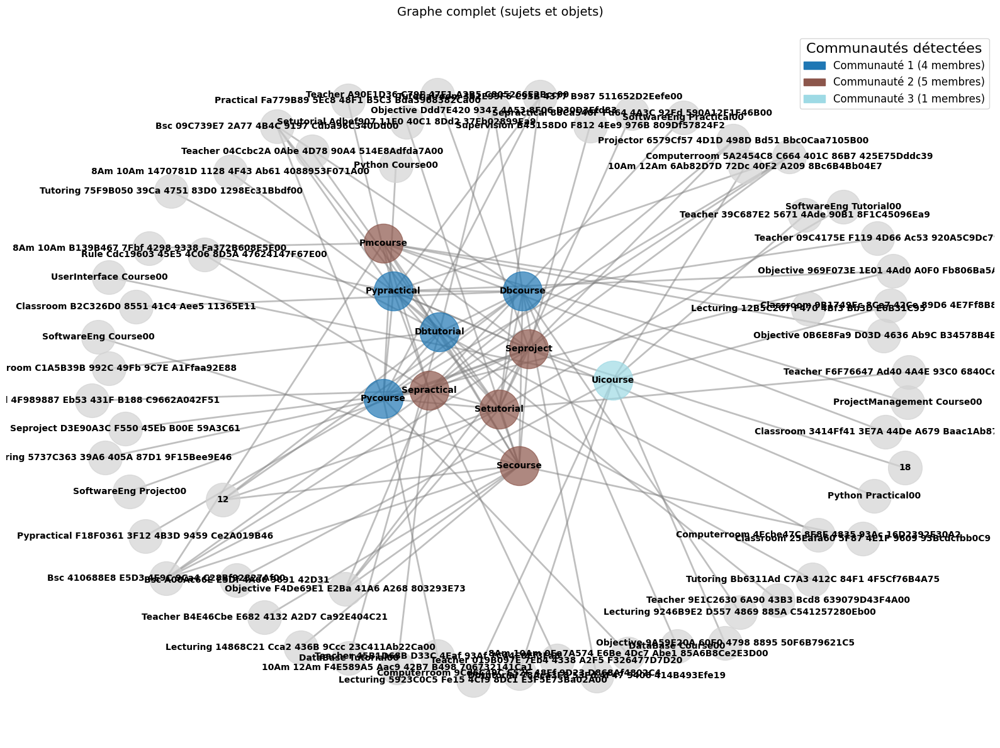

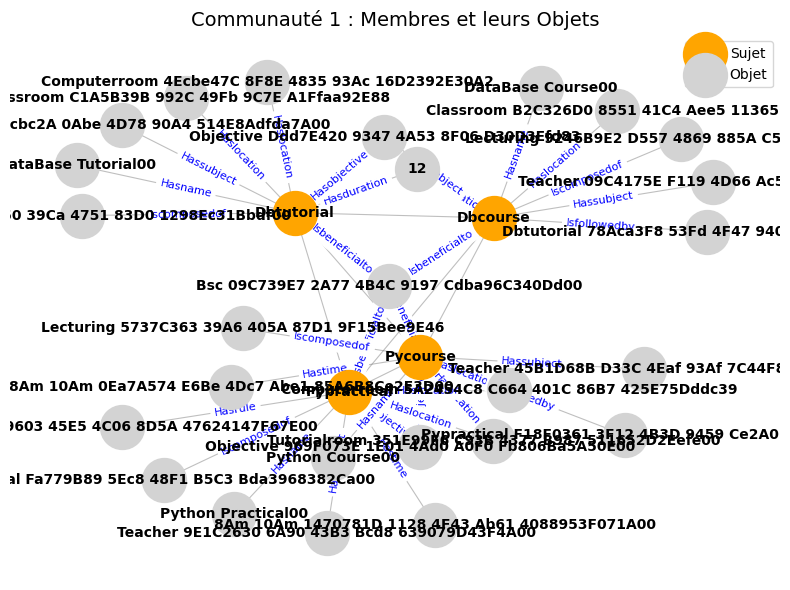

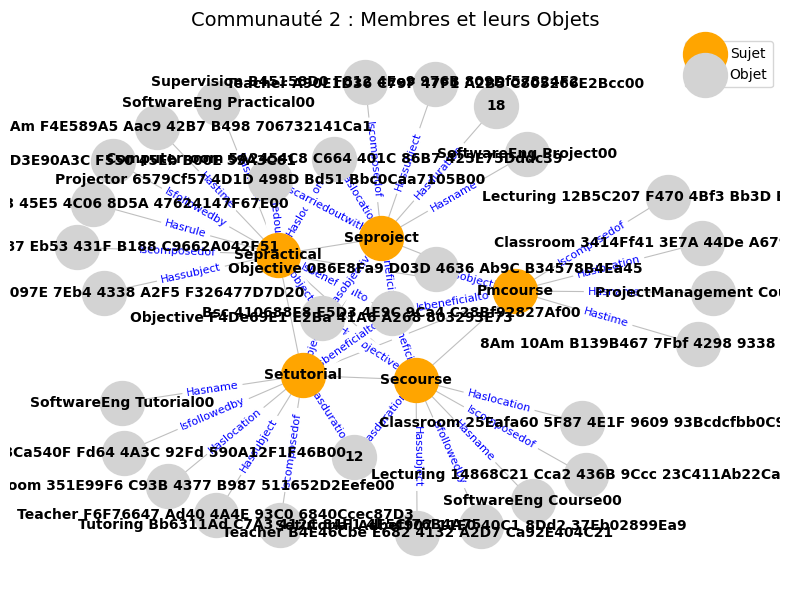

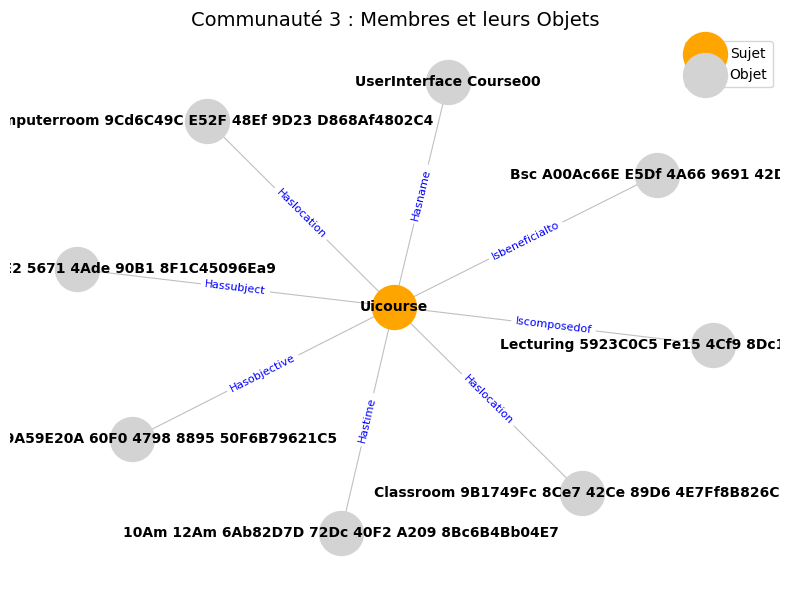

In [181]:
from rdflib import Graph, RDF, Namespace, URIRef
import itertools
import re
import networkx as nx
import matplotlib.pyplot as plt
from networkx.algorithms.community import louvain_communities
import matplotlib.patches as mpatches
import numpy as np

# Définition des espaces de noms
cao_namespace = Namespace("http://sonfack.com/2023/12/cao/")
tao_namespace = Namespace("http://sonfack.com/2023/12/tao/")
rdfs = Namespace("http://www.w3.org/2000/01/rdf-schema#")
rdf = Namespace("http://www.w3.org/1999/02/22-rdf-syntax-ns#")

def extract_name_without_identifiers(uri: str, namespace: str) -> str:
    """Extrait le nom sans identifiants de l'URI après le namespace."""
    match = re.match(f"{re.escape(namespace)}(.+?)(?:[-_].*)?$", uri)
    if match:
        return match.group(1).replace('-', ' ').replace('_', ' ').title()
    return uri

def get_all_activities(graph: Graph) -> dict:
    """
    Retourne un dictionnaire {URI: Nom} pour toutes les activités du graphe.
    On part du principe que les activités sont des sujets de type cao:Activity.
    """
    activities = {
        str(activity): extract_name_without_identifiers(str(activity), str(tao_namespace))
        for activity in graph.subjects(predicate=RDF.type, object=cao_namespace.Activity)
    }
    return activities

def get_shared_objects_count(graph: Graph, subj1: str, subj2: str) -> int:
    """
    Compte le nombre d'objets partagés entre deux sujets.
    On exclut la relation rdf:type.
    """
    query = f"""
    PREFIX rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#>
    PREFIX cao: <http://sonfack.com/2023/12/cao/>
    SELECT (COUNT(DISTINCT ?object) as ?count)
    WHERE {{
        <{subj1}> ?p ?object .
        <{subj2}> ?p ?object .
        FILTER (?p != rdf:type)
    }}
    """
    results = graph.query(query)
    return int(list(results)[0][0])

def get_object_label(o) -> str:
    """
    Extrait une étiquette lisible pour un objet (ou prédicat) RDF.
    Si c'est une URI, on en récupère la dernière partie.
    Sinon, on retourne sa représentation en chaîne.
    """
    if isinstance(o, URIRef):
        uri_str = str(o)
        if '#' in uri_str:
            label = uri_str.split('#')[-1]
        else:
            label = uri_str.split('/')[-1]
        return label.replace('-', ' ').replace('_', ' ').title()
    else:
        return str(o)

def get_objects_with_predicates_for_subject(graph: Graph, subj: str) -> dict:
    """
    Retourne un dictionnaire où les clés sont les étiquettes d'objets
    et les valeurs un ensemble d'étiquettes de prédicats reliant le sujet à cet objet.
    On ignore la propriété rdf:type.
    """
    result = {}
    for s, p, o in graph.triples((URIRef(subj), None, None)):
        if p == RDF.type:
            continue
        pred_label = get_object_label(p)
        obj_label = get_object_label(o)
        if obj_label not in result:
            result[obj_label] = set()
        result[obj_label].add(pred_label)
    return result

def format_object_name(label: str) -> str:
    """
    Formate le nom d'un objet pour qu'il se termine par exactement deux chiffres.
      - Si 'label' se termine par une séquence de chiffres, seuls les deux premiers sont conservés.
      - Sinon, on ajoute '00' à la fin.
    """
    match = re.match(r"^(.*?)(\d+)$", label)
    if match:
        name_part = match.group(1)
        digits = match.group(2)[:2]  # On ne garde que les 2 premiers chiffres
        return name_part + digits
    else:
        return label + "00"

def create_weighted_graph() -> nx.Graph:
    """
    Crée un graphe NetworkX où :
      - Les nœuds de type "subject" représentent les activités (seulement le nom).
      - Les nœuds de type "object" représentent les objets reliés aux sujets, avec leur nom formaté.
      - Les arêtes entre sujets sont pondérées selon le nombre d'objets partagés.
      - Les arêtes entre un sujet et un objet contiennent l'attribut "predicates" avec
        l'ensemble des prédicats observés.
    """
    # Chargement du graphe RDF
    akg_file = "/content/drive/MyDrive/teaching_akg.ttl"
    rdf_graph = Graph()
    rdf_graph.parse(akg_file, format="turtle")

    # Création du graphe NetworkX
    G = nx.Graph()

    # Récupération des activités (sujets)
    activities = get_all_activities(rdf_graph)

    # Ajout des nœuds pour les sujets (uniquement avec leur nom)
    for subj_uri, subj_name in activities.items():
        G.add_node(subj_name, type="subject")

    # Ajout des arêtes pondérées entre sujets selon leurs objets partagés
    subject_pairs = list(itertools.combinations(activities.keys(), 2))
    for subj1, subj2 in subject_pairs:
        weight = get_shared_objects_count(rdf_graph, subj1, subj2)
        if weight > 0:
            G.add_edge(activities[subj1], activities[subj2], weight=weight)

    # Pour chaque sujet, on ajoute les objets associés (formatés) avec leurs relations (prédicats)
    for subj_uri, subj_name in activities.items():
        objects = get_objects_with_predicates_for_subject(rdf_graph, subj_uri)
        for obj_label, pred_set in objects.items():
            formatted_obj_label = format_object_name(obj_label)
            if not G.has_node(formatted_obj_label):
                G.add_node(formatted_obj_label, type="object")
            # Mise à jour des prédicats si l'arête existe déjà
            if G.has_edge(subj_name, formatted_obj_label):
                current_preds = G[subj_name][formatted_obj_label].get('predicates', set())
                G[subj_name][formatted_obj_label]['predicates'] = current_preds.union(pred_set)
            else:
                G.add_edge(subj_name, formatted_obj_label, weight=1, predicates=pred_set)

    return G

def visualize_communities(G: nx.Graph, communities) -> plt.Figure:
    """
    Visualise le graphe complet en affichant :
      - Les nœuds sujets colorés selon leur communauté (détectée par Louvain)
      - Les nœuds objets (affichés en cercles et en gris clair)
      - Toutes les arêtes (sujet-sujet et sujet-objet)
    """
    plt.figure(figsize=(16, 12))
    pos = nx.spring_layout(G, k=1.5, iterations=50, seed=42)

    # Séparer les nœuds selon leur type
    subject_nodes = [n for n, d in G.nodes(data=True) if d.get("type") == "subject"]
    object_nodes = [n for n, d in G.nodes(data=True) if d.get("type") == "object"]

    # Palette de couleurs pour les communautés
    n_communities = len(communities)
    colors = plt.cm.tab20(np.linspace(0, 1, n_communities))

    legend_patches = []
    # Dessin des nœuds sujets par communauté
    for idx, community in enumerate(communities):
        nodes_in_comm = list(community)
        nx.draw_networkx_nodes(G, pos, nodelist=nodes_in_comm,
                               node_color=[colors[idx]], node_size=2000, alpha=0.7)
        patch = mpatches.Patch(color=colors[idx], label=f'Communauté {idx+1} ({len(community)} membres)')
        legend_patches.append(patch)

    # Dessin des nœuds objets en cercles (par défaut)
    nx.draw_networkx_nodes(G, pos, nodelist=object_nodes,
                           node_color='lightgray', node_size=1500, alpha=0.7)

    # Dessin de toutes les arêtes
    nx.draw_networkx_edges(G, pos, edge_color='gray', width=2.0, alpha=0.5)

    # Ajout des étiquettes pour les nœuds
    nx.draw_networkx_labels(G, pos, font_size=10, font_weight='bold')

    plt.legend(handles=legend_patches, loc='upper right',
               title="Communautés détectées", title_fontsize=16, fontsize=12)
    plt.title("Graphe complet (sujets et objets)", pad=20, fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    return plt

def visualize_each_community_with_objects(G: nx.Graph, communities):
    """
    Pour chaque communauté, crée et affiche un sous-graphe composé :
      - Des membres de la communauté (nœuds de type "subject")
      - De tous les objets auxquels ces membres sont reliés (nœuds de type "object")
    Affiche sur les arêtes sujet-objet les prédicats associés.
    """
    for idx, community in enumerate(communities, 1):
        community_subjects = set(community)
        community_objects = set()
        for subj in community_subjects:
            for neighbor in G.neighbors(subj):
                if G.nodes[neighbor].get("type") == "object":
                    community_objects.add(neighbor)
        nodes_sub = community_subjects.union(community_objects)
        subG = G.subgraph(nodes_sub).copy()

        plt.figure(figsize=(8,6))
        pos = nx.spring_layout(subG, seed=42)

        subj_nodes = [n for n in subG.nodes() if subG.nodes[n].get("type") == "subject"]
        obj_nodes  = [n for n in subG.nodes() if subG.nodes[n].get("type") == "object"]

        nx.draw_networkx_nodes(subG, pos, nodelist=subj_nodes,
                               node_color='orange', node_size=1000, label='Sujet')
        nx.draw_networkx_nodes(subG, pos, nodelist=obj_nodes,
                               node_color='lightgray', node_size=1000, label='Objet')
        nx.draw_networkx_edges(subG, pos, edge_color='gray', width=0.8, alpha=0.5)
        nx.draw_networkx_labels(subG, pos, font_size=10, font_weight='bold')

        edge_labels = {}
        for u, v, d in subG.edges(data=True):
            if (subG.nodes[u].get("type") == "subject" and subG.nodes[v].get("type") == "object") or \
               (subG.nodes[v].get("type") == "subject" and subG.nodes[u].get("type") == "object"):
                if "predicates" in d:
                    edge_labels[(u, v)] = ", ".join(d["predicates"])
        nx.draw_networkx_edge_labels(subG, pos, edge_labels=edge_labels, font_color='blue', font_size=8)

        plt.title(f"Communauté {idx} : Membres et leurs Objets", fontsize=14)
        plt.axis('off')
        plt.legend(scatterpoints=1)
        plt.tight_layout()
        plt.show()

def main():
    # Création du graphe complet incluant relations sujet-sujet et sujet-objet
    G = create_weighted_graph()

    # Pour la détection des communautés, on considère uniquement les nœuds de type "subject"
    subject_nodes = [n for n, d in G.nodes(data=True) if d.get("type") == "subject"]
    G_subject = G.subgraph(subject_nodes).copy()

    communities = louvain_communities(G_subject)

    # Affichage des statistiques sur les communautés détectées
    print("\nAnalyse des communautés détectées :")
    for i, community in enumerate(communities, 1):
        print(f"\nCommunauté {i} ({len(community)} membres) :")
        for node in sorted(community):
            print(f" - {node}")

    # Visualisation du graphe complet (sujets et objets)
    plt_fig = visualize_communities(G, communities)
    plt_fig.show()

    # Visualisation par communauté : chaque membre et ses objets
    visualize_each_community_with_objects(G, communities)

if __name__ == "__main__":
    main()


1. Chargement des données RDF...
2. Analyse des activités et de leurs objets...
Nombre d'activités trouvées : 10

3. Analyse des communautés...
Composantes distinctes trouvées : 2

Analyse détaillée des communautés :

Communauté 1:
----------------------------------------
Activités : 4
Objets uniques : 26
Objets partagés : 6

Communauté 2:
----------------------------------------
Activités : 5
Objets uniques : 30
Objets partagés : 5

Communauté 3:
----------------------------------------
Activités : 1
Objets uniques : 8
Objets partagés : 0

4. Création des visualisations...


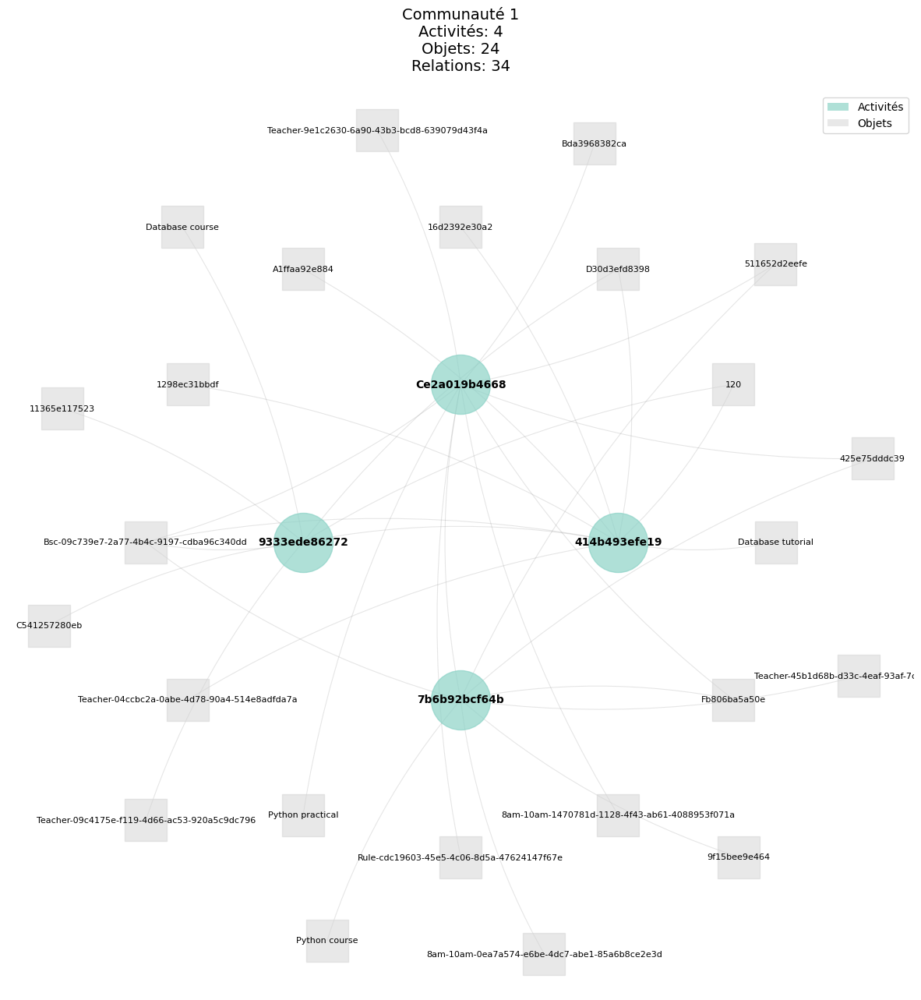

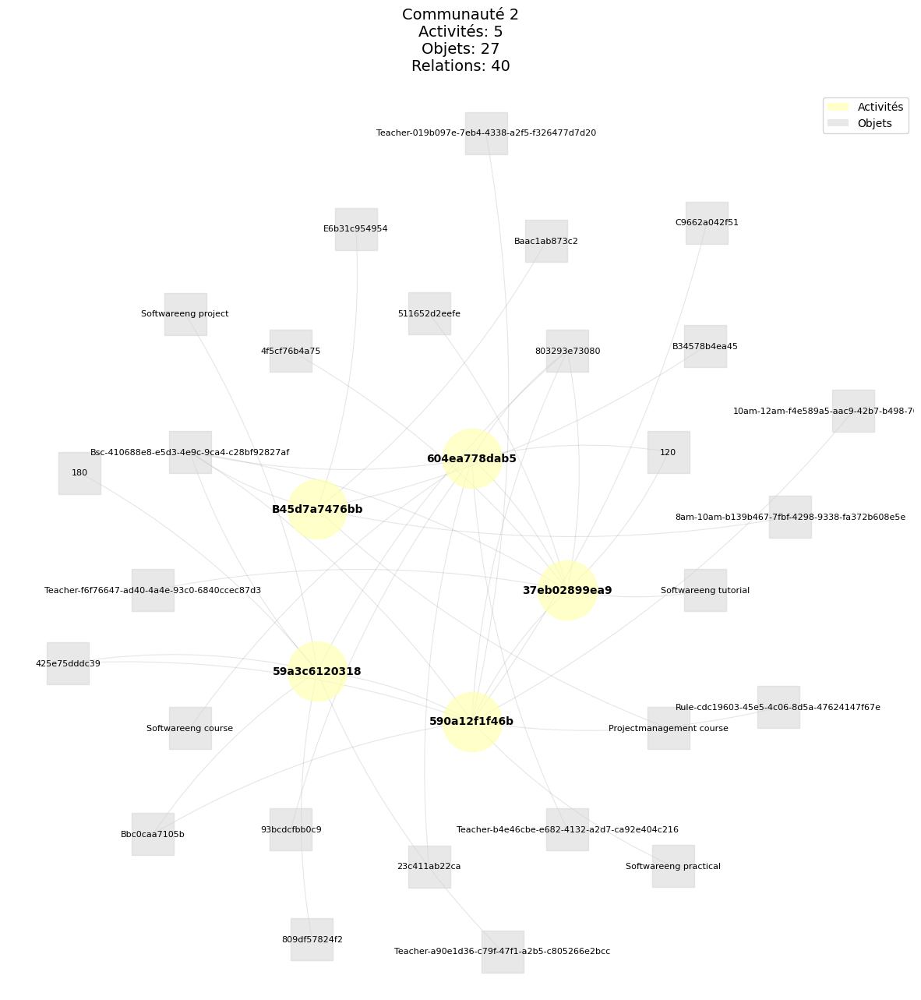

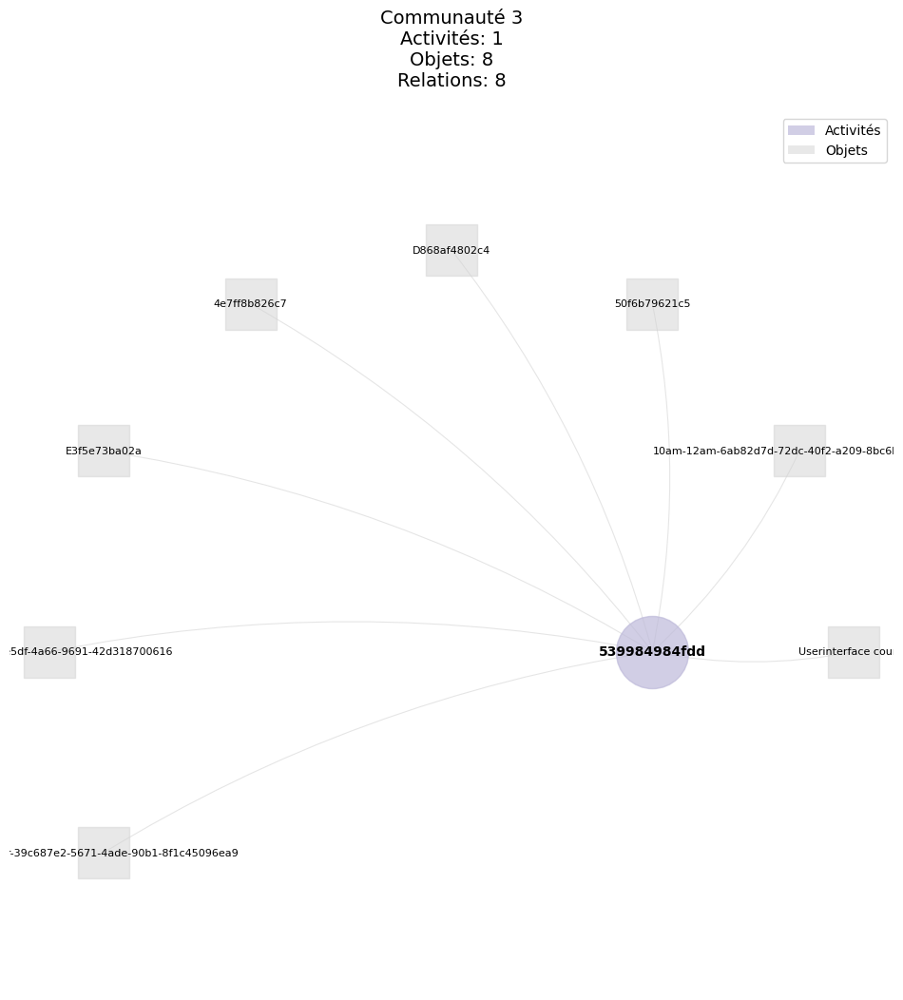


Analyse terminée avec succès.


In [208]:
from rdflib import Graph, RDF, Namespace
import networkx as nx
import matplotlib.pyplot as plt
from networkx.algorithms.community import louvain_communities
import numpy as np
from itertools import combinations

class RDFCommunityAnalyzer:
    """
    Cette classe gère l'analyse complète d'un graphe RDF, incluant la détection
    des communautés et leur visualisation. Elle prend en compte tous les types
    de communautés, y compris celles qui ne partagent pas d'objets.
    """
    def __init__(self, file_path: str):
        # Initialisation des structures de données principales
        self.file_path = file_path
        self.graph = Graph()
        self.nx_graph = nx.Graph()
        self.communities = []
        self.activity_objects = {}
        # Paramètres de visualisation
        self.colors = plt.cm.Set3(np.linspace(0, 1, 12))
        self.activity_size = 3000
        self.object_size = 1500
        # Espace de noms pour les activités
        self.cao = Namespace("http://sonfack.com/2023/12/cao/")

    def load_and_process_data(self):
        """
        Charge les données RDF et prépare le graphe pour l'analyse.
        Cette méthode identifie les activités et leurs objets associés.
        """
        print("1. Chargement des données RDF...")
        self.graph.parse(self.file_path, format="turtle")

        # Récupération des activités du graphe
        activities = list(self.graph.subjects(
            predicate=RDF.type,
            object=self.cao.Activity
        ))

        print("2. Analyse des activités et de leurs objets...")
        # Traitement de chaque activité
        for activity in activities:
            name = self._clean_identifier(activity)
            self.nx_graph.add_node(name, type='activity')

            # Extraction des objets associés
            objects = [
                self._clean_identifier(obj)
                for obj in self.graph.objects(subject=activity)
                if (activity, RDF.type, obj) not in self.graph
            ]
            self.activity_objects[name] = objects

        print(f"Nombre d'activités trouvées : {len(activities)}")
        self._create_connections()
        return len(activities)

    def _clean_identifier(self, uri: str) -> str:
        """
        Nettoie les identifiants pour une meilleure lisibilité.
        Extrait la partie significative des URIs.
        """
        base_name = str(uri).split('/')[-1]
        # Traitement spécial pour les URIs avec tirets (identifiants)
        if '-' in base_name:
            parts = base_name.split('-')
            if len(parts[0]) >= 8:  # Probablement un UUID
                return parts[-1].capitalize()
        return base_name.capitalize()

    def _create_connections(self):
        """
        Établit les connexions entre les activités basées sur leurs objets partagés.
        """
        for act1, act2 in combinations(self.activity_objects.keys(), 2):
            # Calcul des objets partagés
            shared = set(self.activity_objects[act1]) & set(self.activity_objects[act2])
            if shared:
                self.nx_graph.add_edge(act1, act2, weight=len(shared))

    def detect_communities(self):
        """
        Détecte toutes les communautés dans le graphe RDF.
        Cette méthode prend en compte :
        - Les communautés liées par des objets partagés
        - Les groupes d'activités sans partage
        - Les activités isolées
        """
        print("\n3. Analyse des communautés...")

        # Identification des composantes connexes
        components = list(nx.connected_components(self.nx_graph))
        print(f"Composantes distinctes trouvées : {len(components)}")

        all_communities = []
        # Traitement de chaque composante
        for component in components:
            subgraph = self.nx_graph.subgraph(component).copy()

            if len(subgraph) > 1:
                # Application de Louvain pour les grandes composantes
                try:
                    comp_communities = list(louvain_communities(
                        subgraph,
                        weight='weight',
                        resolution=1.0
                    ))
                    all_communities.extend(comp_communities)
                except Exception:
                    # Fallback : traiter comme une seule communauté
                    all_communities.append(list(component))
            else:
                # Nœuds isolés
                all_communities.append(list(component))

        self.communities = all_communities
        self._analyze_communities()

    def _analyze_communities(self):
        """
        Analyse détaillée de chaque communauté détectée.
        """
        print("\nAnalyse détaillée des communautés :")
        for idx, community in enumerate(self.communities, 1):
            print(f"\nCommunauté {idx}:")
            print("-" * 40)

            # Analyse des objets
            community_objects = set()
            shared_objects = set()

            for activity in community:
                if activity in self.activity_objects:
                    objects = set(self.activity_objects[activity])
                    community_objects.update(objects)

                    # Identification des objets partagés
                    for other_activity in community:
                        if other_activity != activity:
                            other_objects = set(self.activity_objects.get(other_activity, []))
                            shared_objects.update(objects & other_objects)

            # Affichage des statistiques
            print(f"Activités : {len(community)}")
            print(f"Objets uniques : {len(community_objects)}")
            print(f"Objets partagés : {len(shared_objects)}")

    def visualize_community(self, community_id: int, nodes: list):
        """
        Crée une visualisation optimisée pour une communauté spécifique.
        Les activités sont placées au centre, entourées de leurs objets.
        """
        H = nx.Graph()
        is_isolated = len(nodes) == 1

        # Configuration de la visualisation
        plt.figure(figsize=(12, 12) if is_isolated else (15, 15))

        # Ajout des nœuds au graphe
        activities = list(nodes)
        for activity in activities:
            H.add_node(activity, type='activity')
            # Ajout des objets associés
            if activity in self.activity_objects:
                for obj in self.activity_objects[activity]:
                    if not H.has_node(obj):
                        H.add_node(obj, type='object')
                    H.add_edge(activity, obj)

        objects = [n for n in H.nodes() if H.nodes[n]['type'] == 'object']

        # Calcul des positions
        pos = self._calculate_node_positions(activities, objects)

        # Dessin des éléments
        self._draw_nodes(H, pos, activities, objects, community_id)
        self._draw_edges(H, pos)
        self._add_visualization_info(H, pos, activities, objects, community_id)

        plt.axis('equal')
        plt.axis('off')
        return plt

    def _calculate_node_positions(self, activities, objects):
        """
        Calcule les positions optimales pour les nœuds.
        Les activités sont placées au centre, les objets autour.
        """
        pos = {}
        # Placement des activités en cercle central
        for i, activity in enumerate(activities):
            angle = 2 * np.pi * i / max(len(activities), 1)
            pos[activity] = 3 * np.array([np.cos(angle), np.sin(angle)])

        # Placement des objets en cercles concentriques
        objects_per_layer = 12
        n_layers = max(1, int(np.ceil(len(objects) / objects_per_layer)))

        for i, obj in enumerate(objects):
            layer = i // objects_per_layer
            pos_in_layer = i % objects_per_layer
            radius = 6 + (layer * 2)
            angle = 2 * np.pi * pos_in_layer / objects_per_layer + (layer * 0.2)
            pos[obj] = radius * np.array([np.cos(angle), np.sin(angle)])

        return pos

    def _draw_nodes(self, H, pos, activities, objects, community_id):
        """
        Dessine les nœuds avec un style adapté.
        """
        # Nœuds d'activités
        nx.draw_networkx_nodes(H, pos,
                             nodelist=activities,
                             node_color=[self.colors[community_id % 12]],
                             node_size=self.activity_size,
                             alpha=0.7)

        # Nœuds d'objets
        nx.draw_networkx_nodes(H, pos,
                             nodelist=objects,
                             node_color='lightgray',
                             node_size=self.object_size,
                             alpha=0.5,
                             node_shape='s')

        # Labels
        nx.draw_networkx_labels(H, pos,
                              {node: node for node in activities},
                              font_size=10,
                              font_weight='bold')
        nx.draw_networkx_labels(H, pos,
                              {node: node for node in objects},
                              font_size=8)

    def _draw_edges(self, H, pos):
        """
        Dessine les connexions avec des courbes de Bézier.
        """
        for u, v in H.edges():
            curve = plt.matplotlib.patches.ConnectionPatch(
                pos[u], pos[v],
                'data', 'data',
                connectionstyle='arc3,rad=0.1',
                alpha=0.2,
                color='gray',
                linewidth=0.8
            )
            plt.gca().add_patch(curve)

    def _add_visualization_info(self, H, pos, activities, objects, community_id):
        """
        Ajoute le titre et la légende à la visualisation.
        """
        # Statistiques de la communauté
        stats = (
            f"Communauté {community_id + 1}\n"
            f"Activités: {len(activities)}\n"
            f"Objets: {len(objects)}\n"
            f"Relations: {H.number_of_edges()}"
        )
        plt.title(stats, pad=20, fontsize=14)

        # Légende
        legend_patches = [
            plt.matplotlib.patches.Patch(
                facecolor=self.colors[community_id % 12],
                alpha=0.7,
                label='Activités'
            ),
            plt.matplotlib.patches.Patch(
                facecolor='lightgray',
                alpha=0.5,
                label='Objets'
            )
        ]
        plt.legend(handles=legend_patches,
                  loc='upper right')

    def analyze_and_visualize(self):
        """
        Méthode principale qui orchestre l'analyse complète.
        """
        try:
            # Chargement et analyse
            self.load_and_process_data()
            self.detect_communities()

            # Préparation pour la visualisation
            partition = {}
            for idx, community in enumerate(self.communities):
                for node in community:
                    partition[node] = idx

            # Visualisation de chaque communauté
            print("\n4. Création des visualisations...")
            for community_id in range(len(self.communities)):
                nodes = [node for node, comm in partition.items()
                        if comm == community_id]
                plt = self.visualize_community(community_id, nodes)
                plt.show()

            print("\nAnalyse terminée avec succès.")

        except Exception as e:
            print(f"Une erreur s'est produite: {str(e)}")
            raise e

def main():
    """
    Point d'entrée du programme.
    """
    graph_file = "/content/drive/MyDrive/teaching_akg.ttl"
    analyzer = RDFCommunityAnalyzer(graph_file)
    analyzer.analyze_and_visualize()

if __name__ == "__main__":
    main()